Ноутбук содержит построение основных графиков, использованных в ВКР Бугаева Егора Петровича "Предсказание погодных условий с помощью гибридных физических нейросетей"

In [1]:
import os
import torch
from torch import nn, einsum
import numpy as np
import matplotlib.pyplot as plt
from einops import rearrange
import torch.nn.functional as F
import math
from fairscale.nn.checkpoint.checkpoint_activations import checkpoint_wrapper

In [2]:
%load_ext autoreload

%autoreload

from Models.WeatherGFT import GFT
from utils.dataloader_ddp import load_data
# from utils.dataloader import load_data
from utils.losses import weighted_rmse, weighted_mae, calculate_metrics

In [3]:
from torch.cuda.amp import autocast, GradScaler

In [4]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


### Веса оригинальной WeatherGFT: исследование

In [13]:
from Data.weatherbench_128_v3 import WeatherBench128
from torch.utils.data import DataLoader

val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-25 00:00:00'

valid_data_2004 = WeatherBench128(start_time=val_start_time, end_time=val_end_time,
                            include_target=False,
                            lead_time=1, 
                            interval=1,
                            muti_target_steps=1,
                            start_time_x=0,
                            end_time_x=11,      
                            start_time_y=12,
                            end_time_y=71, 
                            cut=[[128 - 92, 128 - 60], [256 - 131, 256 - 67]])  
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=8, shuffle=True, num_workers=4)

In [14]:
x, y = next(iter(valid_loader_2004))
print(x.shape, y.shape)

torch.Size([8, 12, 69, 32, 64]) torch.Size([8, 60, 69, 32, 64])


In [8]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

valid_data_2018 = WeatherBench128(start_time='2018-01-01 00:00:00', end_time='2018-12-25 00:00:00',
                                include_target=False, lead_time=1, interval=6, muti_target_steps=6)
valid_loader_2018 = DataLoader(valid_data_2018, batch_size=4, shuffle=False, num_workers=4)

In [ ]:
model_original = GFT(hidden_dim=256,
            encoder_layers=[3, 3, 3],
            edcoder_heads=[3, 6, 6],
            encoder_scaling_factors=[0.5, 0.5, 1], # [128, 256] --> [64, 128] --> [32, 64] --> [32, 64], that is, patch size = 4 (128/32)
            encoder_dim_factors=[-1, 2, 2],

            body_layers=[4, 4, 4, 4, 4, 4], # A total of 4x6=24 HybridBlock, corresponding to 6 hours (24x15min) of time evolution
            body_heads=[8, 8, 8, 8, 8, 8],
            body_scaling_factors=[1, 1, 1, 1, 1, 1],
            body_dim_factors=[1, 1, 1, 1, 1, 1],

            decoder_layers=[3, 3, 3],
            decoder_heads=[6, 6, 3],
            decoder_scaling_factors=[1, 2, 1],
            decoder_dim_factors=[1, 0.5, 1],

            channels=69,
            head_dim=128,
            window_size=[4,8],
            relative_pos_embedding=False,
            out_kernel=[2,2],

            pde_block_depth=3, # 1 HybridBlock contains 3 PDE kernels, corresponding to 15 minutes (3x300s) of time evolution
            block_dt=300, # One PDE kernel corresponds to 300s of time evolution
            inverse_time=False).to(device)

In [13]:
if os.path.exists('checkpoints/gft.ckpt'):
    ckpt = torch.load('checkpoints/gft.ckpt', map_location=device)
    model.load_state_dict(ckpt, strict=True)
    print('[complete loading model]')

[complete loading model]


In [14]:
# Считаем количество параметров
total_params = sum(p.numel() for p in model.parameters())

print(f'Количество параметров в модели: {total_params}')

Количество параметров в модели: 470584357


In [15]:
# Извлекаем веса всех слоев
weights = []
for param in model.parameters():
    if param.requires_grad:  # Это означает, что параметр обновляется во время обучения
        weights.append(param.data.cpu().numpy())  # Переводим в numpy для удобства

# Объединяем все веса в один массив для построения гистограммы
all_weights = np.concatenate([w.flatten() for w in weights])

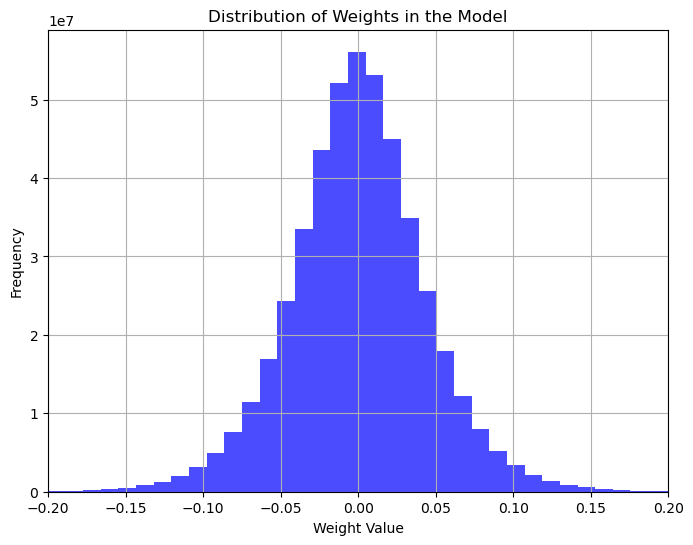

In [16]:
# Строим гистограмму
plt.figure(figsize=(8, 6))
plt.hist(all_weights, bins=1000, color='blue', alpha=0.7)
plt.title('Distribution of Weights in the Model')
plt.xlabel('Weight Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.xlim(-0.2, 0.2)
plt.show()

## Вспомогательные функции

In [7]:
variable_list = [
        0, 1, 2, 4 ,
        6 ,7 ,8 ,9 ,10,11,12,13,14,15,16,17,18,
        19,20,21,22,23,24,25,26,27,28,29,30,31,
        45,46,47,48,49,50,51,52,53,54,55,56,57,
        58,59,60,61,62,63,64,65,66,67,68,69,70,
        71,72,73,74,75,76,77,78,79,80,81,82,83]

mean_std = np.load("/home/epbugaev/weather_bench/1.40625deg/mean_std.npy")
mean = torch.tensor(mean_std[0][variable_list]).reshape(1, 69, 1, 1).to(device).detach()
std = torch.tensor(mean_std[1][variable_list]).reshape(1, 69, 1, 1).to(device).detach()

In [17]:
from torch.nn.functional import l1_loss, mse_loss
import tqdm

def get_validation_accuracy(model, dataloader, complete_cycles=4):
    global mean, std
    
    key_ind = [0, 1, 6 + 7 - 2, 19 + 10 - 2] # t2m, u10, z500, t850
    
    with torch.no_grad():
        mistakes_list = torch.zeros((4, 24))
        mistakes_map = torch.zeros((4, 24, 128, 256))
        predictions_map = torch.zeros((4, 24, 128, 256))
        y_true_map = torch.zeros((4, 24, 128, 256))
        
        cnt_list = torch.zeros((4, 24))        
        for pred, y in tqdm.tqdm(dataloader):
            y = y.to(device) * std + mean    

            pred = pred.to(device)

            for i in range(complete_cycles):
                if len(pred.shape) == 5:
                    pred = pred[:, 5] # Leave only last_hour prediction and start from it
                
                pred = model(pred)

                for j in range(4):
                    for hour in range(6):                        
                        # print('loss i:', i, 'j:', j, ':', l1_loss((pred * std + mean)[:, hour, key_ind[j]], y[:, hour + i * 6, key_ind[j]]).cpu())
                        mistakes_list[j, hour + i * 6] += l1_loss((pred * std + mean)[:, hour, key_ind[j]], y[:, hour + i * 6, key_ind[j]]).cpu() #torch.sqrt(mse_loss((pred * std + mean)[:, hour, key_ind[j]], y[:, hour + i * 6, key_ind[j]])).cpu()
                        cnt_list[j, hour + i * 6] += 1  
                        
                    
                        predictions_map[j, hour + i * 6] += (pred * std + mean)[0, hour, key_ind[j]].cpu()
                        y_true_map[j, hour + i * 6] += y[0, hour + i * 6, key_ind[j]].cpu()
                        mistakes_map[j, hour + i * 6] += torch.abs((pred * std + mean)[0, hour, key_ind[j]] - y[0, hour + i * 6, key_ind[j]]).cpu()
                        
                        
    return mistakes_list / cnt_list, mistakes_map / cnt_list[:, :, None, None],\
           predictions_map / cnt_list[:, :, None, None], y_true_map / cnt_list[:, :, None, None]

In [18]:
from torch.nn.functional import l1_loss, mse_loss
import tqdm

def get_val_acc_full(model, dataloader, complete_cycles=4):
    global mean, std
        
    with torch.no_grad():
        mistakes_list = torch.zeros((69, 24))
        mistakes_map = torch.zeros((69, 24, 32, 64))
        predictions_map = torch.zeros((69, 24, 32, 64))
        y_true_map = torch.zeros((69, 24, 32, 64))
        
        cnt_list = torch.zeros((4, 24))        
        for pred, y in tqdm.tqdm(dataloader):
            y = y.to(device) * std + mean    

            pred = pred.to(device)

            for i in range(complete_cycles):
                if len(pred.shape) == 5:
                    pred = pred[:, 5] # Leave only last_hour prediction and start from it
                
                pred = model(pred)

                for hour in range(6):                        
                    # print('loss i:', i, 'j:', j, ':', l1_loss((pred * std + mean)[:, hour, key_ind[j]], y[:, hour + i * 6, key_ind[j]]).cpu())
                    mistakes_list[hour + i * 6, :] += l1_loss((pred * std + mean)[:, hour, ...], y[:, hour + i * 6, ...]).cpu() #torch.sqrt(mse_loss((pred * std + mean)[:, hour, key_ind[j]], y[:, hour + i * 6, key_ind[j]])).cpu()
                    cnt_list[hour + i * 6, :] += 1  


                    predictions_map[hour + i * 6, :] += (pred * std + mean)[0, hour, ...].cpu()
                    y_true_map[hour + i * 6, :] += y[0, hour + i * 6, key_ind[j]].cpu()
                    mistakes_map[hour + i * 6, :] += torch.abs((pred * std + mean)[0, hour, ...] - y[0, hour + i * 6, ...]).cpu()

                        
    return mistakes_list / cnt_list, mistakes_map / cnt_list[:, :, None, None],\
           predictions_map / cnt_list[:, :, None, None], y_true_map / cnt_list[:, :, None, None]

In [19]:
def load_model(model, path, cut_names=True): 
    ckpt = torch.load(path, map_location=torch.device('cpu'))
    weights = {}
    
    if cut_names:
        for key in ckpt['state_dict']: 
            weights[key[6:]] = ckpt['state_dict'][key]
    else: 
        weights = ckpt['state_dict']

    model.load_state_dict(weights, strict=True)
    print('[complete loading model]')
    return model

## Распределение learnable_physics_coef весов

In [5]:
model_ours = GFT(hidden_dim=256,
            physics_part_coef=None,
            encoder_layers=[2, 2, 2],
            edcoder_heads=[2, 4, 4],
            encoder_scaling_factors=[0.5, 0.5, 1], # [128, 256] --> [64, 128] --> [32, 64] --> [32, 64], that is, patch size = 4 (128/32)
            encoder_dim_factors=[-1, 2, 2],

            body_layers=[4, 4, 4, 4, 4, 4], # A total of 4x6=24 HybridBlock, corresponding to 6 hours (24x15min) of time evolution
            body_heads=[6, 6, 6, 6, 6, 6],
            body_scaling_factors=[1, 1, 1, 1, 1, 1],
            body_dim_factors=[1, 1, 1, 1, 1, 1],

            decoder_layers=[2, 2, 2],
            decoder_heads=[4, 4, 2],
            decoder_scaling_factors=[1, 2, 1],
            decoder_dim_factors=[1, 0.5, 1],

            channels=69,
            head_dim=128,
            window_size=[4,8],
            relative_pos_embedding=False,
            out_kernel=[2,2],

            pde_block_depth=3, # 1 HybridBlock contains 3 PDE kernels, corresponding to 15 minutes (3x300s) of time evolution
            block_dt=300, # One PDE kernel corresponds to 300s of time evolution
            inverse_time=False).to(device)

model_ours.eval()
model_ours.out_layer = [0, 1, 2, 3, 4, 5]

In [6]:
ckpt = torch.load('/home/epbugaev/checkpoints/learnable_physics_importance_matrix/2025-02-05-21:18rvnjx/last.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]

model_ours.load_state_dict(weights, strict=True)
print('[complete loading model]')

[complete loading model]


In [11]:
mistakes_coef_learnable_2004 = get_validation_accuracy(model_ours, valid_loader_2004, complete_cycles=4) 

100%|██████████| 184/184 [10:15<00:00,  3.34s/it]


In [13]:
mistakes_coef_learnable, mistakes_map_learnable, pred_map_learnable, y_true_map_learnable = mistakes_coef_learnable_2004

dict_validation_coef_learnable = {'t2m': mistakes_coef_learnable[0], 'u10': mistakes_coef_learnable[1], 'z500': mistakes_coef_learnable[2], 't850': mistakes_coef_learnable[3]}
dict_validation_coef_learnable_maps = {'mistakes': mistakes_map_learnable, 'pred': pred_map_learnable, 'real': y_true_map_learnable}

torch.save(dict_validation_coef_learnable, 'checkpoints/physical_learnable_validation.results')
torch.save(dict_validation_coef_learnable_maps, 'checkpoints/physical_learnable_validation_maps.results')

In [8]:
weights_distribution = model_ours.get_learnable_physics_importance()

(array([1.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00, 0.00000e+00,
        0.00000e+00, 1.00000e+00, 1.00000e+00, 1.00000e+00, 0.00000e+00,
        9.00000e+00, 5.00000e+00, 1.30000e+01, 8.00000e+00, 1.80000e+01,
        2.20000e+01, 3.60000e+01, 5.10000e+01, 6.10000e+01, 1.13000e+02,
        1.16000e+02, 1.45000e+02, 2.12000e+02, 2.89000e+02, 3.60000e+02,
        4.79000e+02, 6.84000e+02, 9.22000e+02, 1.18200e+03, 1.69200e+03,
        2.21100e+03, 3.08300e+03, 4.18600e+03, 5.73500e+03, 7.77800e+03,
        1.08020e+04, 1.45360e+04, 1.99010e+04, 2.73800e+04, 3.81290e+04,
        5.31030e+04, 7.47590e+04, 1.06413e+05, 1.51379e+05, 2.15779e+05,
        3.03145e+05, 4.18677e+05, 5.62392e+05, 7.20519e+05, 8.65901e+05,
        9.62556e+05, 9.80251e+05, 9.18155e+05, 7.96994e+05, 6.42329e+05,
        4.91250e+05, 3.60391e+05, 2.55274e+05, 1.76898e+05, 1.21832e+05,
        8.28520e+04, 5.68540e+04, 3.85700e+04, 2.70070e+04, 1.84650e+04,
        1.27740e+04, 8.86100e+03, 6.19400e+03, 4.35

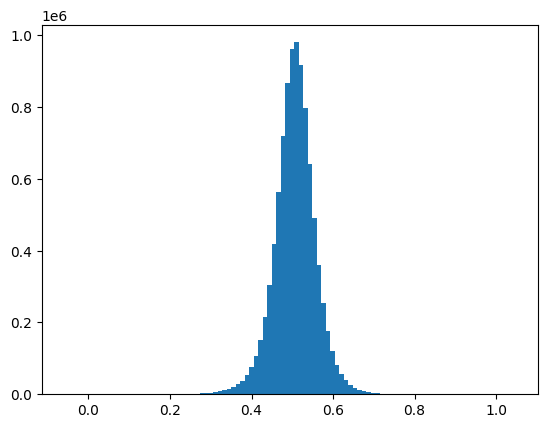

In [8]:
import matplotlib.pyplot as plt

plt.hist(weights_distribution.flatten(), bins=100)

In [24]:
print(weights_distribution.shape)
print(torch.mean(weights_distribution, (0, 1)).shape)

torch.Size([72, 65, 32, 64])
torch.Size([32, 64])


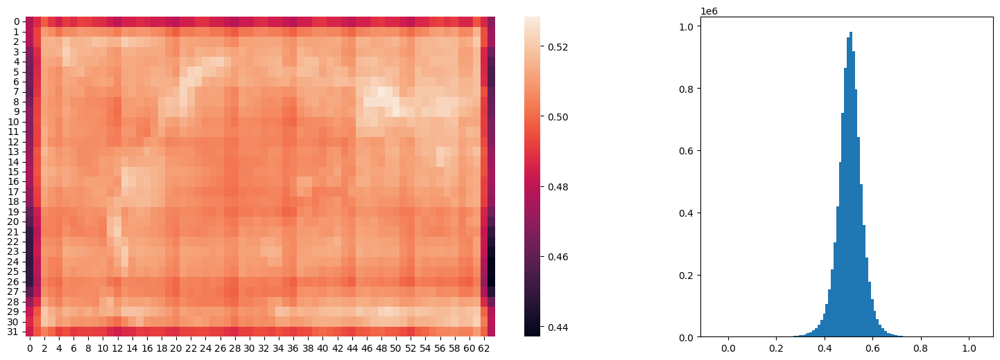

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(15,6), 
    gridspec_kw={'width_ratios': [2, 1]}
)
sns.heatmap(torch.flip(torch.mean(weights_distribution.cpu(), (0, 1)), dims=(0, 1)), ax=ax[0])
ax[1].hist(weights_distribution.cpu().flatten(), bins=100)
#plt.title('Physics importance coefs')

plt.savefig('physics_imp_mean_by_c.png', dpi=150, bbox_inches='tight')

plt.show()

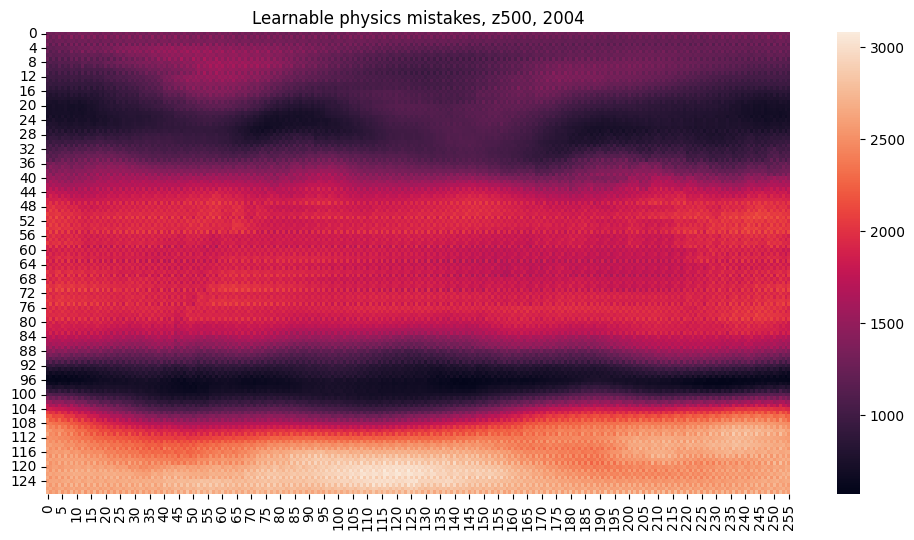

In [17]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_learnable_maps['mistakes'][2].mean(axis=0), dims=(0, 1)), ax=ax)
plt.title('Learnable physics mistakes, z500, 2004')
plt.show()

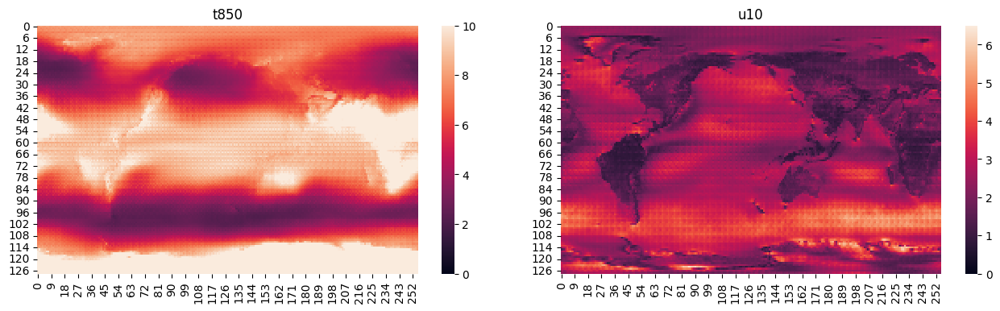

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(16,4))

sns.heatmap(torch.flip(dict_validation_coef_learnable_maps['mistakes'][3].mean(axis=0), dims=(0, 1)), ax=ax[0], vmin=0, vmax=10)
ax[0].set_title('t850')

sns.heatmap(torch.flip(dict_validation_coef_learnable_maps['mistakes'][1].mean(axis=0), dims=(0, 1)), vmin=0, vmax=6.5, ax=ax[1])
ax[1].set_title('u10')

#plt.title('Physics importance coefs')

plt.subplots_adjust(wspace=0.1)
plt.savefig('physics_mistakes.png', dpi=150, bbox_inches='tight')

plt.show()

In [38]:
dict_val = torch.load('checkpoints/physical_learnable_validation_maps.results')
my_map = torch.flip(dict_val['mistakes'][1].mean(axis=0), dims=(0, 1))

In [79]:
my_map = torch.flip(dict_val['real'][1, 5], dims=(0, 1)) #t2m, u10, z500, t850

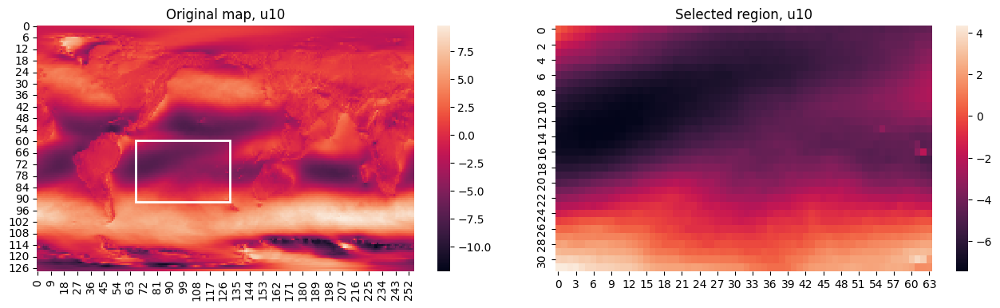

In [88]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.patches import Rectangle

fig, ax = plt.subplots(1, 2, figsize=(16,4))

sns.heatmap(my_map, ax=ax[0])
ax[0].set_title('Original map, u10')

x1, x2 = 60, 92 # 128 - 92, 128 - 60  # First dimension
y1, y2 = 67, 131 #256 - 131, 256 - 67  # Second dimension

rect = Rectangle((y1, x1), y2-y1, x2-x1, 
                 linewidth=2, edgecolor='white', facecolor='none')
ax[0].add_patch(rect)

sns.heatmap(my_map[60:92, 67:131], ax=ax[1])
ax[1].set_title('Selected region, u10')

plt.subplots_adjust(wspace=0.1)
plt.savefig('maps_example.png', dpi=150, bbox_inches='tight')

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.patches import Rectangle

fig, ax = plt.subplots(1, 1, figsize=(7,4))

sns.heatmap(my_map, ax=ax, cbar=False)
#ax.set_title('Original map')

x1, x2 = 60, 92 # 128 - 92, 128 - 60  # First dimension
y1, y2 = 67, 131 #256 - 131, 256 - 67  # Second dimension

rect = Rectangle((y1, x1), y2-y1, x2-x1, 
                 linewidth=2, edgecolor='white', facecolor='none')
ax.add_patch(rect)

#sns.heatmap(my_map[60:92, 67:131], ax=ax[1])
#ax[1].set_title('Selected region')

plt.subplots_adjust(wspace=0.1)
plt.savefig('physics_mistakes.png', dpi=150, bbox_inches='tight')

plt.show()

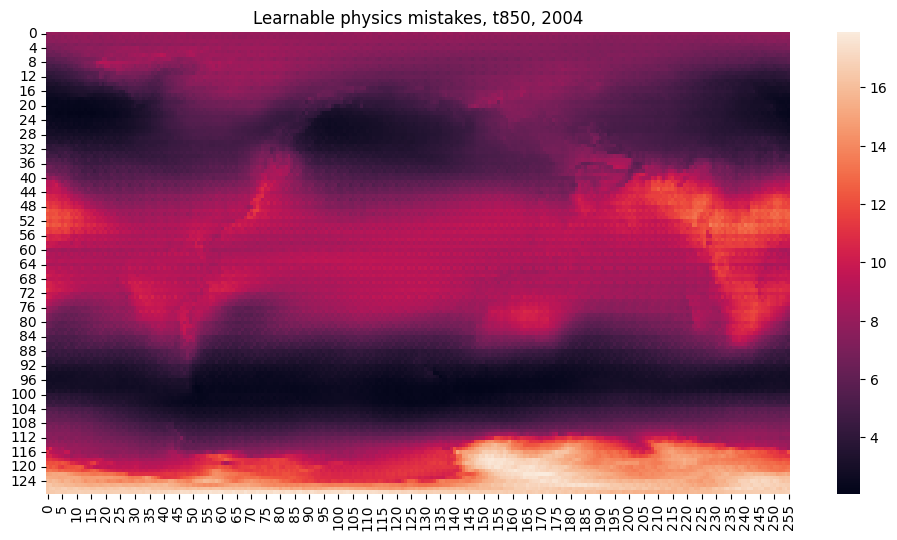

In [28]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_learnable_maps['mistakes'][3].mean(axis=0), dims=(0, 1)), ax=ax)

plt.title('Learnable physics mistakes, t850, 2004')
plt.show()

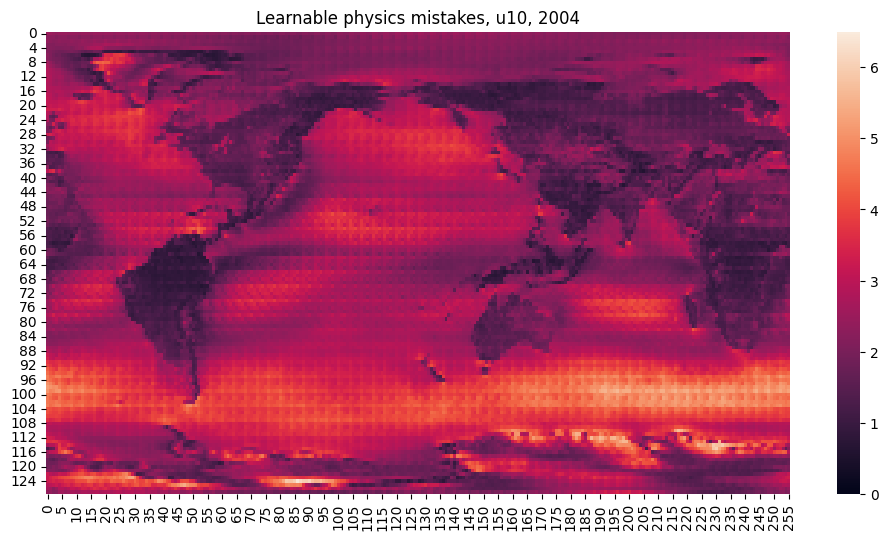

In [15]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_learnable_maps['mistakes'][1].mean(axis=0), dims=(0, 1)), vmin=0, vmax=6.5, ax=ax)
plt.title('Learnable physics mistakes, u10, 2004')
plt.show()

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_learnable_maps['mistakes'][1].mean(axis=0), dims=(0, 1)), vmin=0, vmax=6.5, ax=ax)
plt.title('Learnable physics mistakes, u10, 2004')
plt.show()

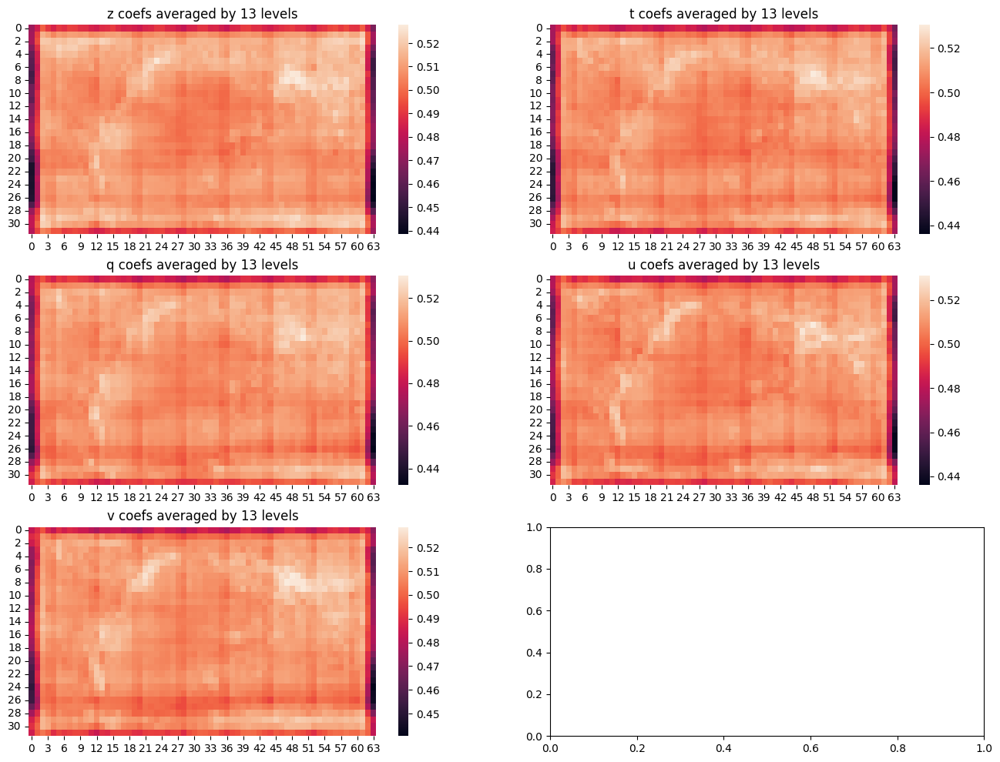

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(3, 2, figsize=(16,12))

variable_names = ["z", "t", "q", "u", "v"]

for i in range(5):
    sns.heatmap(torch.flip(torch.mean(weights_distribution[:, i * 13:(i+1)*13, :, :], (0, 1)), dims=(0, 1)), ax=ax[i // 2][i % 2])
    ax[i // 2][i % 2].set_title(variable_names[i] + ' coefs averaged by 13 levels')

plt.show()

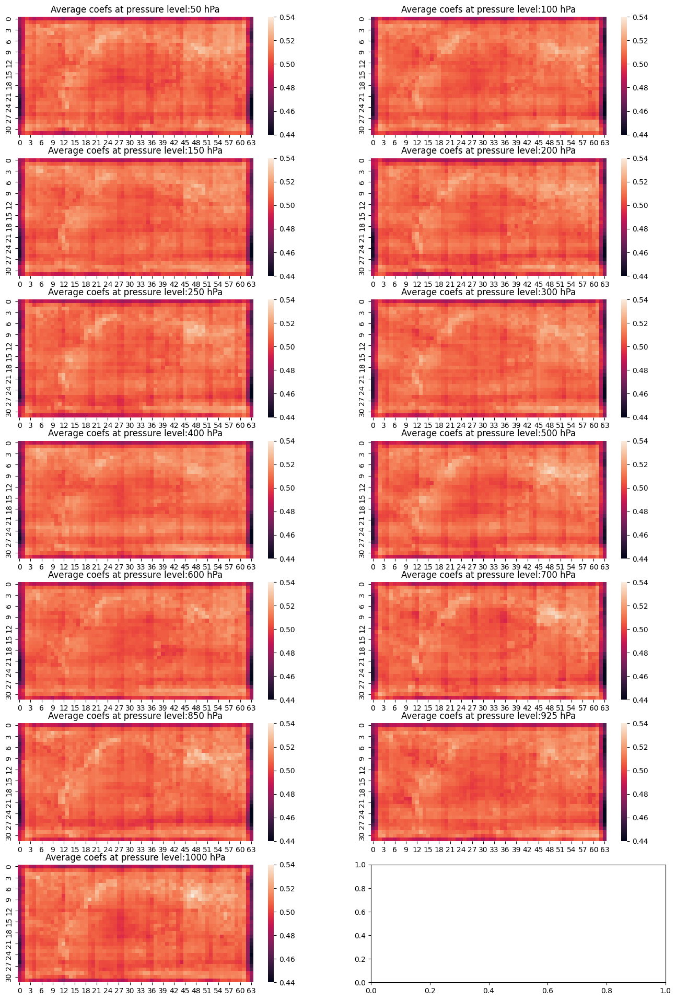

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(7, 2, figsize=(16,24))

pressure_levels = range(13)
pressure_level_map = [50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]

for i in pressure_levels:
    ind = np.array([0, 13, 26, 39, 52]) + i
    
    sns.heatmap(torch.flip(torch.mean(weights_distribution[:, ind, :, :], (0, 1)), dims=(0, 1)), ax=ax[i // 2][i % 2], vmin=0.44, vmax=0.54)
    ax[i // 2][i % 2].set_title('Average coefs at pressure level:' + str(pressure_level_map[i]) + ' hPa')

plt.show()

In [38]:
print(torch.mean(weights_distribution, (0)).shape)

torch.Size([65, 32, 64])


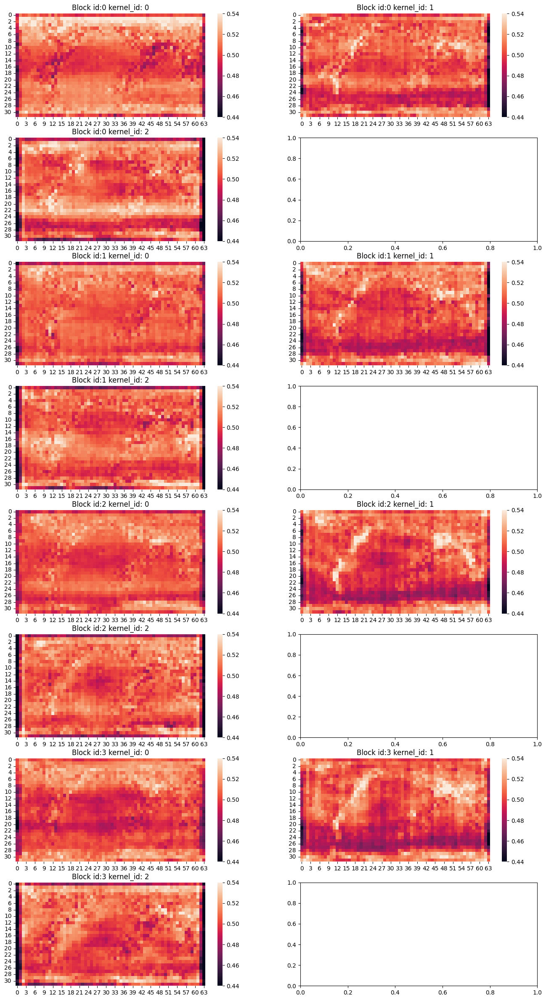

In [44]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(8, 2, figsize=(16,30))


for block_id in range(0, 4):
    for kernel_id in range(3):
        i_ind = 2 * block_id + kernel_id // 2
        j_ind = kernel_id % 2
        
        sns.heatmap(torch.flip(torch.mean(weights_distribution[block_id * 3 + kernel_id, :, :, :], (0)), dims=(0, 1)), ax=ax[i_ind][j_ind], vmin=0.44, vmax=0.54)
        ax[i_ind][j_ind].set_title('Block id:' + str(block_id) + ' kernel_id: ' + str(kernel_id))

plt.show()

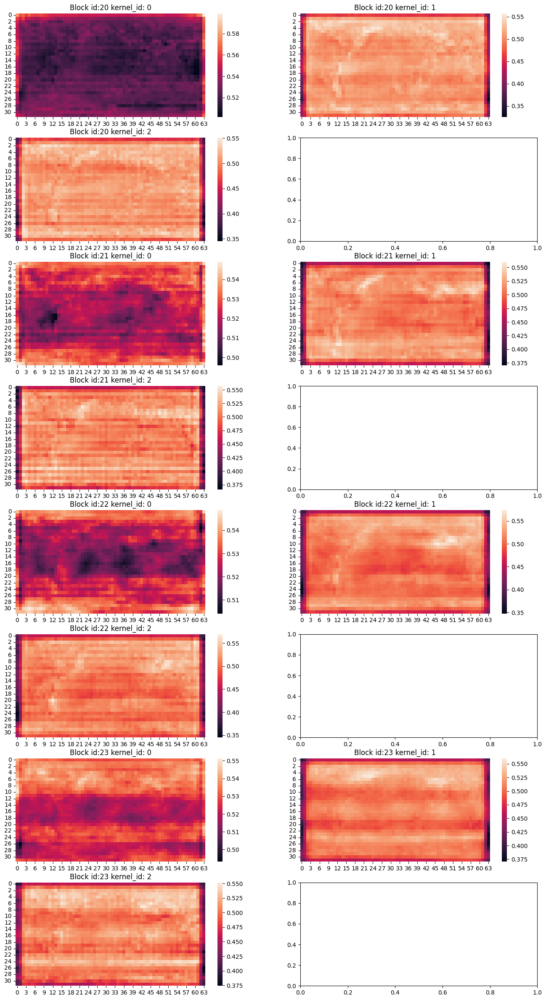

In [46]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(8, 2, figsize=(16,30))


for block_id in range(20, 24):
    for kernel_id in range(3):
        i_ind = 2 * (block_id - 20) + kernel_id // 2
        j_ind = kernel_id % 2
        
        sns.heatmap(torch.flip(torch.mean(weights_distribution[block_id * 3 + kernel_id, :, :, :], (0)), dims=(0, 1)), ax=ax[i_ind][j_ind], vmin=0.44, vmax=0.54)
        ax[i_ind][j_ind].set_title('Block id:' + str(block_id) + ' kernel_id: ' + str(kernel_id))

plt.show()

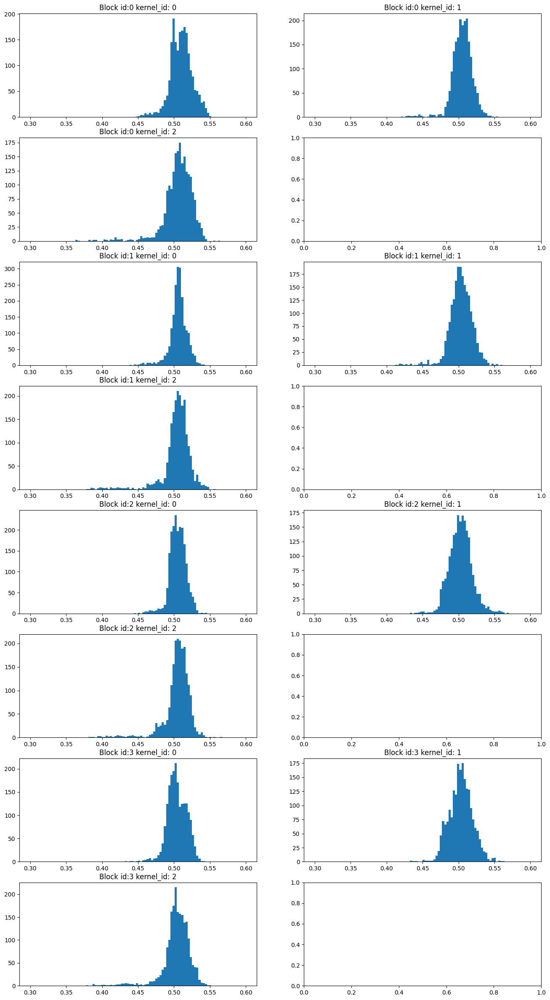

In [51]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(8, 2, figsize=(16,30))


for block_id in range(0, 4):
    for kernel_id in range(3):
        i_ind = 2 * (block_id) + kernel_id // 2
        j_ind = kernel_id % 2
        
        ax[i_ind][j_ind].hist(torch.mean(weights_distribution[block_id * 3 + kernel_id, :, :, :], (0)).flatten(), bins=100, range=(0.3, 0.6))
        ax[i_ind][j_ind].set_title('Block id:' + str(block_id) + ' kernel_id: ' + str(kernel_id))

plt.show()

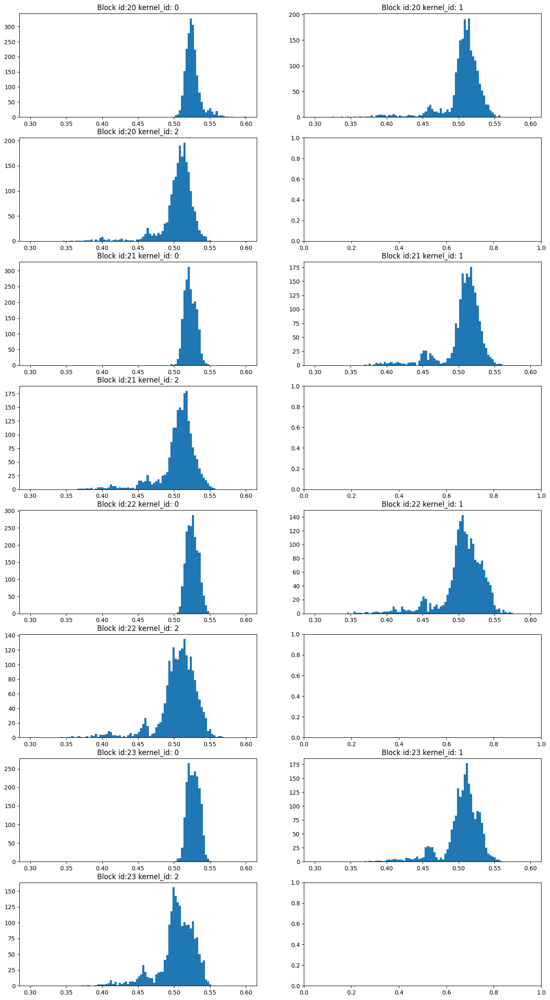

In [52]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(8, 2, figsize=(16,30))


for block_id in range(20, 24):
    for kernel_id in range(3):
        i_ind = 2 * (block_id - 20) + kernel_id // 2
        j_ind = kernel_id % 2
        
        ax[i_ind][j_ind].hist(torch.mean(weights_distribution[block_id * 3 + kernel_id, :, :, :], (0)).flatten(), bins=100, range=(0.3, 0.6))
        ax[i_ind][j_ind].set_title('Block id:' + str(block_id) + ' kernel_id: ' + str(kernel_id))

plt.show()

## Инференс наших версий модели

In [10]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

valid_data_2004 = WeatherBench128(start_time='2004-01-01 00:00:00', end_time='2004-12-25 00:00:00',
                                include_target=False, lead_time=1, interval=47, muti_target_steps=24)
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=1, shuffle=False, num_workers=4)

In [28]:
model_ours = GFT(hidden_dim=256,
            physics_part_coef=0.9,
            encoder_layers=[2, 2, 2],
            edcoder_heads=[2, 4, 4],
            encoder_scaling_factors=[0.5, 0.5, 1], # [128, 256] --> [64, 128] --> [32, 64] --> [32, 64], that is, patch size = 4 (128/32)
            encoder_dim_factors=[-1, 2, 2],

            body_layers=[4, 4, 4, 4, 4, 4], # A total of 4x6=24 HybridBlock, corresponding to 6 hours (24x15min) of time evolution
            body_heads=[6, 6, 6, 6, 6, 6],
            body_scaling_factors=[1, 1, 1, 1, 1, 1],
            body_dim_factors=[1, 1, 1, 1, 1, 1],

            decoder_layers=[2, 2, 2],
            decoder_heads=[4, 4, 2],
            decoder_scaling_factors=[1, 2, 1],
            decoder_dim_factors=[1, 0.5, 1],

            channels=69,
            head_dim=128,
            window_size=[4,8],
            relative_pos_embedding=False,
            out_kernel=[2,2],

            pde_block_depth=3, # 1 HybridBlock contains 3 PDE kernels, corresponding to 15 minutes (3x300s) of time evolution
            block_dt=300, # One PDE kernel corresponds to 300s of time evolution
            inverse_time=False).to(device)

model_ours.eval()
model_ours.out_layer = [0, 1, 2, 3, 4, 5]

In [22]:
ckpt = torch.load('/home/epbugaev/checkpoints/physics_imp_is_0dot1 fixed/2024-12-19-14:215isgc/epoch=15-val_loss=0.0670.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]

model_ours.load_state_dict(weights, strict=True)
print('[complete loading model]')

[complete loading model]


In [ ]:
mistakes_coef_01, mistakes_map_01, pred_map_01, y_true_map_01 = get_validation_accuracy(model_ours, valid_loader_2004, complete_cycles=4)

In [39]:
mistakes_coef_01_2018 = get_validation_accuracy(model_ours, valid_loader_2018, complete_cycles=4) 

100%|██████████| 183/183 [12:01<00:00,  3.94s/it]


In [20]:
dict_validation_coef_01 = {'t2m': mistakes_coef_01[0], 'u10': mistakes_coef_01[1], 'z500': mistakes_coef_01[2], 't850': mistakes_coef_01[3]}
dict_validation_coef_01_maps = {'mistakes': mistakes_map_01, 'pred': pred_map_01, 'real': y_true_map_01}

torch.save(dict_validation_coef_01, 'checkpoints/physical_01_validation.results')
torch.save(dict_validation_coef_01_maps, 'checkpoints/physical_01_validation_maps.results')

In [25]:
ckpt = torch.load('/home/epbugaev/checkpoints/physics_imp_is_0dot5 fixed/2024-12-19-14:26qrcv0/epoch=16-val_loss=0.0666.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]

model_ours.load_state_dict(weights, strict=True)
print('[complete loading model]')

[complete loading model]


In [26]:
mistakes_coef_05, mistakes_map_05, pred_map_05, y_true_map_05 = get_validation_accuracy(model_ours, valid_loader_2004, complete_cycles=4)

100%|██████████| 184/184 [11:20<00:00,  3.70s/it]


In [27]:
dict_validation_coef_05 = {'t2m': mistakes_coef_05[0], 'u10': mistakes_coef_05[1], 'z500': mistakes_coef_05[2], 't850': mistakes_coef_05[3]}
dict_validation_coef_05_maps = {'mistakes': mistakes_map_05, 'pred': pred_map_05, 'real': y_true_map_05}

torch.save(dict_validation_coef_05, 'checkpoints/physical_05_validation.results')
torch.save(dict_validation_coef_05_maps, 'checkpoints/physical_05_validation_maps.results')

In [29]:
ckpt = torch.load('/home/epbugaev/checkpoints/physics_imp_is_0dot9 fixed/2024-12-19-14:36vg8lr/epoch=13-val_loss=0.0890.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]

model_ours.load_state_dict(weights, strict=True)
print('[complete loading model]')

[complete loading model]


In [30]:
mistakes_coef_09, mistakes_map_09, pred_map_09, y_true_map_09 = get_validation_accuracy(model_ours, valid_loader_2004, complete_cycles=4)

100%|██████████| 184/184 [11:19<00:00,  3.69s/it]


In [31]:
dict_validation_coef_09 = {'t2m': mistakes_coef_09[0], 'u10': mistakes_coef_09[1], 'z500': mistakes_coef_09[2], 't850': mistakes_coef_09[3]}
dict_validation_coef_09_maps = {'mistakes': mistakes_map_09, 'pred': pred_map_09, 'real': y_true_map_09}

torch.save(dict_validation_coef_09, 'checkpoints/physical_09_validation.results')
torch.save(dict_validation_coef_09_maps, 'checkpoints/physical_09_validation_maps.results')

[]

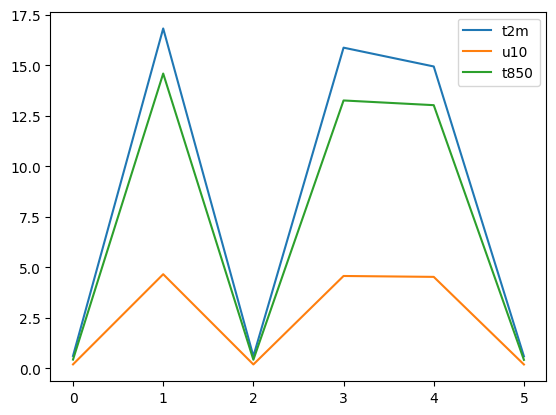

In [30]:
import matplotlib.pyplot as plt

plot.title('Predictions in single model run')
plt.xlabel('Hours')
plt.ylabel('MAE')
plt.plot(range(6), mistakes_coef_01[0, :6], label='t2m')
plt.plot(range(6), mistakes_coef_01[1, :6], label='u10')
#plt.plot(range(6), mistakes_coef_01[2, :6], label='z500')
plt.plot(range(6), mistakes_coef_01[3, :6], label='t850')

plt.legend()
plt.plot()

In [38]:
print(mistakes_coef_01[0])

tensor([ 0.6138, 16.8176,  0.6007, 15.8682, 14.9377,  0.5936,  0.6386, 16.8169,
         0.6273, 15.8592, 14.9264,  0.6227,  0.6692, 16.8174,  0.6596, 15.8507,
        14.9188,  0.6570,  0.7045, 16.8193,  0.6963, 15.8430, 14.9136,  0.6951])


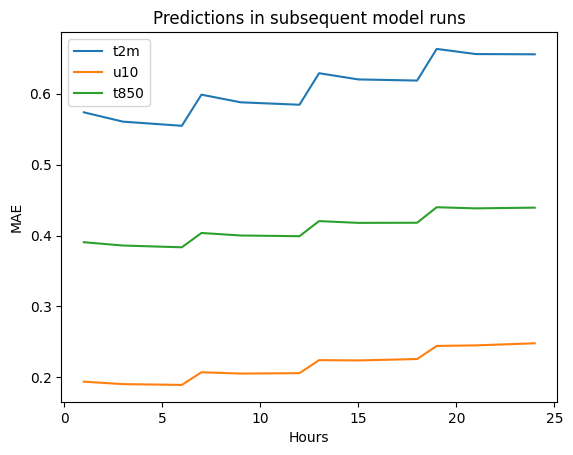

In [55]:
import matplotlib.pyplot as plt

plt.title('Predictions in subsequent model runs')
plt.xlabel('Hours')
plt.ylabel('MAE')

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])

plt.plot(ids + 1, mistakes_coef_01[0, ids], label='t2m')
plt.plot(ids + 1, mistakes_coef_01[1, ids], label='u10')
#plt.plot(range(6), mistakes_coef_01[2, :6], label='z500')
plt.plot(ids + 1, mistakes_coef_01[3, ids], label='t850')

plt.legend()
plt.show()

## Инференс оригинальной модели

In [112]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

valid_data_2004 = WeatherBench128(start_time='2004-01-01 00:00:00', end_time='2004-12-25 00:00:00',
                                include_target=False, lead_time=1, interval=47, muti_target_steps=24)
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=1, shuffle=False, num_workers=4)

In [118]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

valid_data_2018 = WeatherBench128(start_time='2018-01-01 00:00:00', end_time='2018-12-25 00:00:00',
                                include_target=False, lead_time=1, interval=73, muti_target_steps=24)
valid_loader_2018 = DataLoader(valid_data_2018, batch_size=2, shuffle=False, num_workers=4)

In [113]:
model_original = GFT(hidden_dim=256,
            physics_part_coef=0.1,
            encoder_layers=[2, 2, 2],
            edcoder_heads=[3, 6, 6],
            encoder_scaling_factors=[0.5, 0.5, 1], # [128, 256] --> [64, 128] --> [32, 64] --> [32, 64], that is, patch size = 4 (128/32)
            encoder_dim_factors=[-1, 2, 2],

            body_layers=[4, 4, 4, 4, 4, 4], # A total of 4x6=24 HybridBlock, corresponding to 6 hours (24x15min) of time evolution
            body_heads=[8, 8, 8, 8, 8, 8],
            body_scaling_factors=[1, 1, 1, 1, 1, 1],
            body_dim_factors=[1, 1, 1, 1, 1, 1],

            decoder_layers=[2, 2, 2],
            decoder_heads=[6, 6, 3],
            decoder_scaling_factors=[1, 2, 1],
            decoder_dim_factors=[1, 0.5, 1],

            channels=69,
            head_dim=128,
            window_size=[4,8],
            relative_pos_embedding=False,
            out_kernel=[2,2],

            pde_block_depth=3, # 1 HybridBlock contains 3 PDE kernels, corresponding to 15 minutes (3x300s) of time evolution
            block_dt=300, # One PDE kernel corresponds to 300s of time evolution
            inverse_time=False).to(device)

model_original.eval()
model_original.out_layer = [0, 1, 2, 3, 4, 5]

In [114]:
ckpt = torch.load('/home/epbugaev/WeatherPredictions/checkpoints/gft.ckpt', map_location=torch.device('cpu'))
weights = {}
#for key in ckpt['state_dict']: 
#    weights[key[6:]] = ckpt['state_dict'][key]
weights = ckpt

model_original.load_state_dict(weights, strict=True)
print('[complete loading model]')

[complete loading model]


In [ ]:
from torch.nn.functional import l1_loss, mse_loss

complete_cycles = 4
timestep = 6

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 128, 256))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 128, 256))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 128, 256))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 128, 256))

    cnt_list = 0        
    skip_time = 0
    
    for pred, y in tqdm.tqdm(valid_loader_2018):
        y = y.to(device) * std + mean    
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):                
            pred = model_original(pred)
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            
            pred=pred[:, -1, ...]
            
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

In [ ]:
dict_validation_original = {'t2m': mistakes_coef_original_mae_2004[0], 'u10': mistakes_coef_original_mae_2004[1], 'z500': mistakes_coef_original_mae_2004[2], 't850': mistakes_coef_original_mae_2004[3]}
torch.save(dict_validation_original, 'checkpoints/original_2018_saved.results')

In [12]:
mistakes_coeа_mae = get_validation_accuracy(model_original, valid_loader_2004, complete_cycles=4)

100%|██████████| 184/184 [11:46<00:00,  3.84s/it]


In [121]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/original_mae_2004.results')

In [122]:
dict_orig_full = torch.load('checkpoints/original_mae_2004.results')

In [93]:
from Models.FedorPredFormer import PredFormer_Model

model_config = {
        # image h w c
        'height': 32,
        'width': 64,
        'num_channels': 69,
        # video length in and out
        'pre_seq': 12,
        'after_seq': 12,
        # patch size
        'patch_size': 8,
        'dim': 256, 
        'heads': 8,
        'dim_head': 32,
        # dropout
        'dropout': 0.0,
        'attn_dropout': 0.0,
        'drop_path': 0.0,
        'scale_dim': 4,
        # depth
        'depth': 2,
        'Ndepth': 18,
        'path_to_constants': '/home/fratnikov/weather_bench/1.40625deg/constants/constants_1.40625deg.nc',
    }

torch_model = PredFormer_Model(model_config)

In [126]:
dict_orig_full['mistakes_list'][ids, 4 + 7]

tensor([  88.7133, 3160.9136,   81.4489, 3380.8096, 3034.1040,   23.9562,
          98.2283, 3160.4429,   88.6477, 3386.7502, 3033.3362,   31.8889,
          98.7344, 3163.1624,   90.6100, 3387.1694, 3034.6716,   40.6606,
         102.1324, 3163.6196,   94.2882, 3391.4919, 3035.9883,   48.3650])

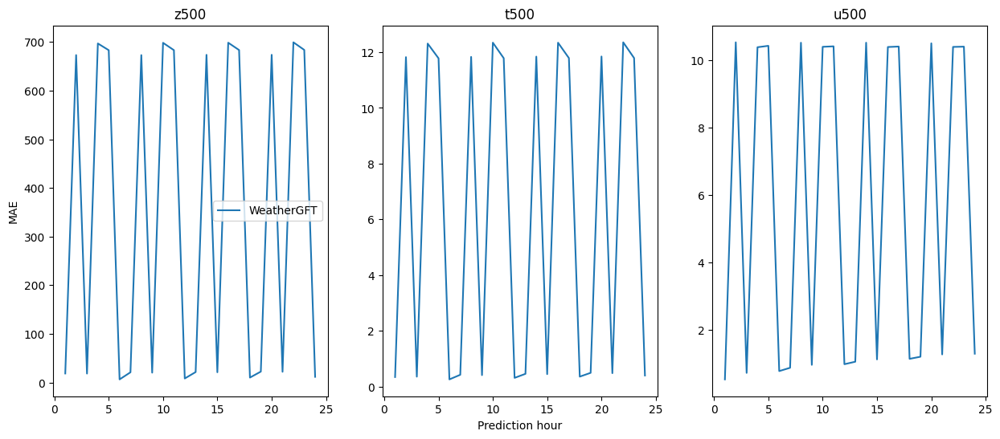

In [124]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(1, 3, figsize=(15,6))
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.arange(24)

ax[0].set_title('z500')
ax[0].set_ylabel('MAE')
ax[0].plot(ids + 1, dict_orig_full['mistakes_list'][ids, 4 + 7], label='WeatherGFT')

ax[1].set_title('t500')
ax[1].set_xlabel('Prediction hour')
ax[1].plot(ids + 1, dict_orig_full['mistakes_list'][ids, 17 + 7], label='WeatherGFT')

ax[2].set_title('u500')
ax[2].plot(ids + 1, dict_orig_full['mistakes_list'][ids, 43 + 7], label='WeatherGFT')

ax[0].legend()
fig.savefig('quality_predformers.png', dpi=150, bbox_inches='tight')
fig.show()

## Small World WeatherGFT

In [10]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-25 00:00:00' # '2004-01-01 23:00:00' #
    
valid_data_2004 = WeatherBench128(start_time=val_start_time, end_time=val_end_time,
                                include_target=False, lead_time=1, interval=19, muti_target_steps=60, cut=[[128 - 92, 128 - 60], [256 - 131, 256 - 67]])
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=16, shuffle=False, num_workers=4)

In [145]:
from Models.WeatherGFTSmallWorld import GFT as GFT_Small

torch_model = GFT_Small(hidden_dim=256,
                    physics_part_coef=0.1, # None means using learnable matrix C x H x W
                    encoder_layers=[2, 2, 2], # original: [3, 3, 3]
                    edcoder_heads=[2, 4, 4], # original: [3, 6, 6]
                    encoder_scaling_factors=[0.5, 0.5, 1], # [128, 256] --> [64, 128] --> [32, 64] --> [32, 64], that is, patch size = 4 (128/32)
                    encoder_dim_factors=[-1, 2, 2],

                    body_layers=[2, 2, 2, 2, 2, 2], # A total of 4x6=24 HybridBlock, corresponding to 6 hours (24x15min) of time evolution
                    body_heads=[6, 6, 6, 6, 6, 6], # original: [8, 8, 8, 8, 8, 8]
                    body_scaling_factors=[1, 1, 1, 1, 1, 1],
                    body_dim_factors=[1, 1, 1, 1, 1, 1],

                    decoder_layers=[2, 2, 2], # original: [3, 3, 3]
                    decoder_heads=[4, 4, 2], # original: [6, 6, 3]
                    decoder_scaling_factors=[1, 2, 1],
                    decoder_dim_factors=[1, 0.5, 1],

                    channels=69,
                    head_dim=128,
                    window_size=[4,8],
                    relative_pos_embedding=False,
                    out_kernel=[2,2],
                    
                    pde_block_depth=3, # 1 HybridBlock contains 3 PDE kernels, corresponding to 15 minutes (3x300s) of time evolution
                    block_dt=300, # One PDE kernel corresponds to 300s of time evolution
                    inverse_time=False, 
                    use_checkpoint=True)

In [146]:
ckpt = torch.load('/home/ebugaev/checkpoints/WeatherGFT classic Small World/2025-05-04-15:0063z4s/epoch=03-val_loss=0.3167.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [ ]:
from torch.nn.functional import l1_loss, mse_loss

complete_cycles = 10
timestep = 6

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    skip_time = 0
    
    for pred, y in tqdm.tqdm(valid_loader_2004):
        y = y.to(device) * std + mean    
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):                
            print('pred shape:', pred.shape)
            pred = torch_model(pred)
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            
            pred=pred[:, -1, ...]
            
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

In [149]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/original_small_mae_2004.results')

In [150]:
dict_orig_small = torch.load('checkpoints/original_small_mae_2004.results')

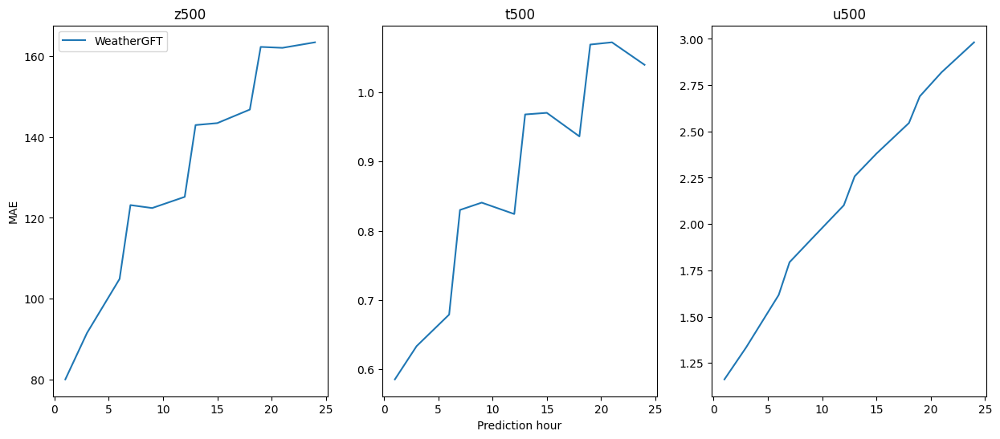

In [154]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(1, 3, figsize=(15,6))
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])  # np.arange(24)

ax[0].set_title('z500')
ax[0].set_ylabel('MAE')
ax[0].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 4 + 7], label='WeatherGFT')

ax[1].set_title('t500')
ax[1].set_xlabel('Prediction hour')
ax[1].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 17 + 7], label='WeatherGFT')

ax[2].set_title('u500')
ax[2].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 43 + 7], label='WeatherGFT')

ax[0].legend()
fig.savefig('quality_predformers.png', dpi=150, bbox_inches='tight')
fig.show()

## WeatherGFT SingleBlock

In [19]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-25 00:00:00' # '2004-01-01 23:00:00' #
    
valid_data_2004 = WeatherBench128(start_time=val_start_time, end_time=val_end_time,
                                include_target=False, lead_time=1, interval=19, muti_target_steps=60, cut=[[128 - 92, 128 - 60], [256 - 131, 256 - 67]])
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=32, shuffle=False, num_workers=4)

In [3]:
from Models.WeatherGFTSingle import GFT as GFT_Small_Single


torch_model = GFT_Small_Single(hidden_dim=256,
                    physics_part_coef=0.1, # None means using learnable matrix C x H x W
                    encoder_layers=[2, 2, 2], # original: [3, 3, 3]
                    edcoder_heads=[2, 4, 4], # original: [3, 6, 6]
                    encoder_scaling_factors=[0.5, 0.5, 1], # [128, 256] --> [64, 128] --> [32, 64] --> [32, 64], that is, patch size = 4 (128/32)
                    encoder_dim_factors=[-1, 2, 2],

                    body_layers=[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], # A total of 4x6=24 HybridBlock, corresponding to 6 hours (24x15min) of time evolution
                    body_heads=[6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], # original: [8, 8, 8, 8, 8, 8]
                    body_scaling_factors=[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
                    body_dim_factors=[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],

                    decoder_layers=[2, 2, 2], # original: [3, 3, 3]
                    decoder_heads=[4, 4, 2], # original: [6, 6, 3]
                    decoder_scaling_factors=[1, 2, 1],
                    decoder_dim_factors=[1, 0.5, 1],

                    channels=69,
                    head_dim=128,
                    window_size=[4,8],
                    relative_pos_embedding=False,
                    out_kernel=[2,2],
                    
                    pde_block_depth=3, # 1 HybridBlock contains 3 PDE kernels, corresponding to 15 minutes (3x300s) of time evolution
                    block_dt=300, # One PDE kernel corresponds to 300s of time evolution
                    inverse_time=False, 
                    use_checkpoint=True)

In [11]:
ckpt = torch.load('/home/epbugaev/checkpoints/train_single_block Small World/2025-04-30-19:22xmw74/epoch=09-val_loss=0.3197.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [20]:
from torch.nn.functional import l1_loss, mse_loss

complete_cycles = 5
timestep = 12

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    skip_time = 0
    
    for pred, y in tqdm.tqdm(valid_loader_2004):
        y = y.to(device) * std + mean    
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):                
            pred = torch_model(pred)
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            
            pred=pred[:, -1, ...]
            
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

100%|██████████| 15/15 [16:15<00:00, 65.04s/it]


In [21]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/single_block_small_mae_2004.results')

In [22]:
dict_orig_small = torch.load('checkpoints/original_small_mae_2004.results')
dict_single_small = torch.load('checkpoints/single_block_small_mae_2004.results')

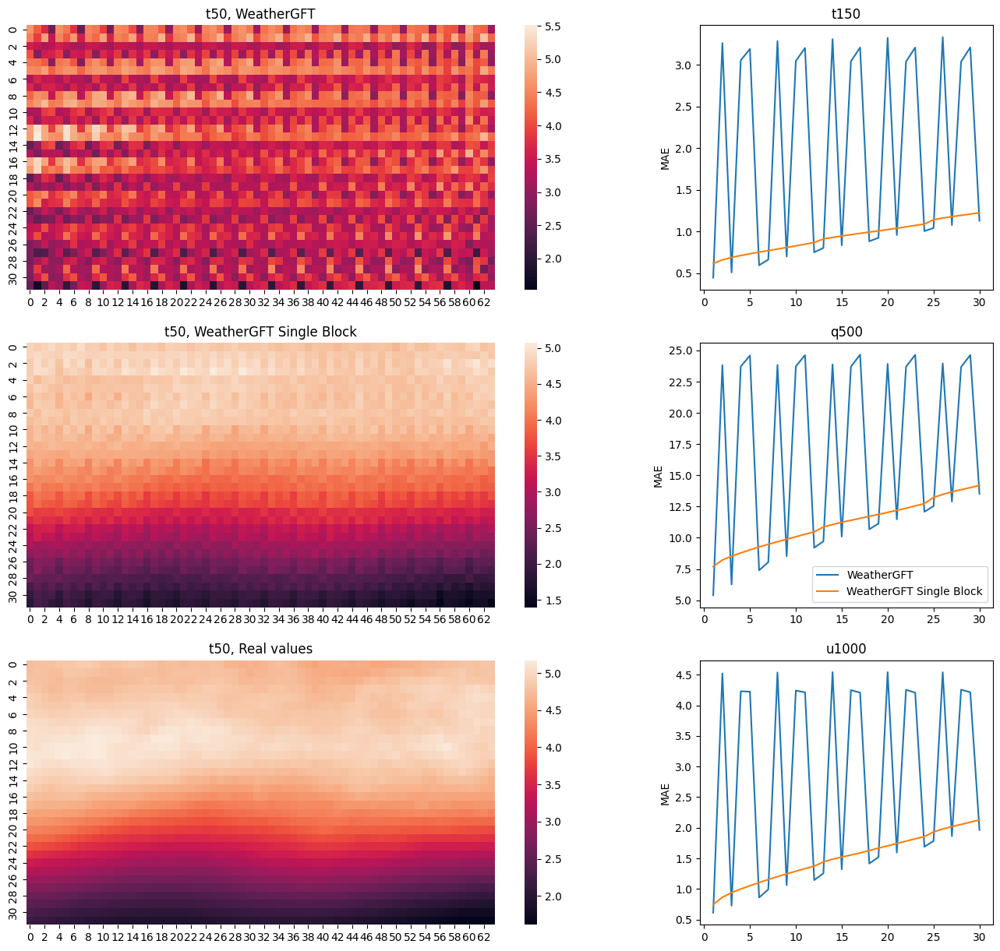

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(3, 2, figsize=(16,15), gridspec_kw={'width_ratios': [2, 1]})
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.arange(30) #np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23, 24, 26, 29])  # np.arange(24)

pictures_id = 30 + 0

ax[0][0].set_title('t50, WeatherGFT')
sns.heatmap(torch.flip(dict_orig_small['predictions_map'][1, pictures_id], dims=(0, 1)), ax=ax[0][0])

ax[0][1].set_title('t150')
ax[0][1].set_ylabel('MAE')
ax[0][1].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 17 + 2], label='WeatherGFT')
ax[0][1].plot(ids + 1, dict_single_small['mistakes_list'][ids, 17 + 2], label='WeatherGFT Single Block')


ax[1][0].set_title('t50, WeatherGFT Single Block')
sns.heatmap(torch.flip(dict_single_small['predictions_map'][1, pictures_id], dims=(0, 1)), ax=ax[1][0])

ax[1][1].set_title('q500')
ax[1][1].set_ylabel('MAE')
ax[1][1].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 30 + 7], label='WeatherGFT')
ax[1][1].plot(ids + 1, dict_single_small['mistakes_list'][ids, 30 + 7], label='WeatherGFT Single Block')


ax[2][0].set_title('t50, Real values')
sns.heatmap(torch.flip(dict_single_small['y_true_map'][1, pictures_id], dims=(0, 1)), ax=ax[2][0])

ax[2][1].set_ylabel('MAE')
ax[2][1].set_title('u1000')
ax[2][1].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 43 + 12], label='WeatherGFT')
ax[2][1].plot(ids + 1, dict_single_small['mistakes_list'][ids, 43 + 12], label='WeatherGFT Single Block')

ax[1][1].legend()
fig.savefig('single_block_vs_full.png', dpi=150, bbox_inches='tight')
fig.show()

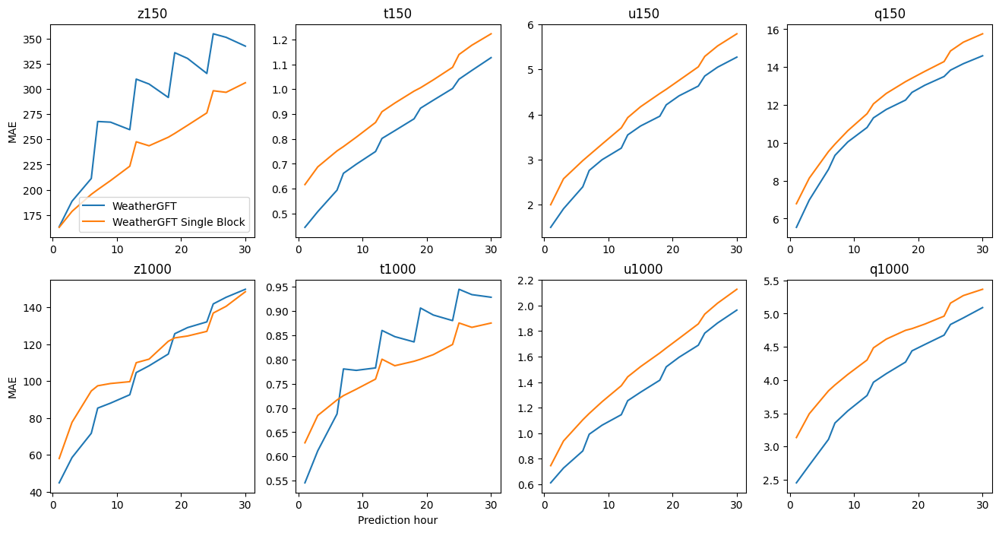

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(2, 4, figsize=(16,8))
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23, 24, 26, 29])  # np.arange(24)

ax[0][0].set_title('z150')
ax[0][0].set_ylabel('MAE')
ax[0][0].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 4 + 2], label='WeatherGFT')
ax[0][0].plot(ids + 1, dict_single_small['mistakes_list'][ids, 4 + 2], label='WeatherGFT Single Block')


ax[0][1].set_title('t150')
ax[0][1].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 17 + 2], label='WeatherGFT')
ax[0][1].plot(ids + 1, dict_single_small['mistakes_list'][ids, 17 + 2], label='WeatherGFT Single Block')


ax[0][2].set_title('u150')
ax[0][2].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 43 + 2], label='WeatherGFT')
ax[0][2].plot(ids + 1, dict_single_small['mistakes_list'][ids, 43 + 2], label='WeatherGFT Single Block')

ax[0][3].set_title('q150')
ax[0][3].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 30 + 2], label='WeatherGFT')
ax[0][3].plot(ids + 1, dict_single_small['mistakes_list'][ids, 30 + 2], label='WeatherGFT Single Block')

ax[1][0].set_title('z1000')
ax[1][0].set_ylabel('MAE')
ax[1][0].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 4 + 12], label='WeatherGFT')
ax[1][0].plot(ids + 1, dict_single_small['mistakes_list'][ids, 4 + 12], label='WeatherGFT Single Block')


ax[1][1].set_title('t1000')
ax[1][1].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 17 + 12], label='WeatherGFT')
ax[1][1].plot(ids + 1, dict_single_small['mistakes_list'][ids, 17 + 12], label='WeatherGFT Single Block')
ax[1][1].set_xlabel('Prediction hour')


ax[1][2].set_title('u1000')
ax[1][2].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 43 + 12], label='WeatherGFT')
ax[1][2].plot(ids + 1, dict_single_small['mistakes_list'][ids, 43 + 12], label='WeatherGFT Single Block')

ax[1][3].set_title('q1000')
ax[1][3].plot(ids + 1, dict_orig_small['mistakes_list'][ids, 30 + 12], label='WeatherGFT')
ax[1][3].plot(ids + 1, dict_single_small['mistakes_list'][ids, 30 + 12], label='WeatherGFT Single Block')

ax[0][0].legend()
fig.savefig('quality_predformers.png', dpi=150, bbox_inches='tight')
fig.show()

## Raw PredFormer

In [94]:
ckpt = torch.load('/home/epbugaev/checkpoints/fedor_predformer_small_world/2025-04-30-01:56bql6o/epoch=06-val_loss=0.1418.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [95]:
from torch.nn.functional import l1_loss, mse_loss

complete_cycles = 5
timestep = 12

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    
    for pred, y in tqdm.tqdm(valid_loader_subset_2004):
        y = y.to(device) * std + mean    
        print('Counting')
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):                
            pred = torch_model(pred)
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

  0%|          | 0/57 [00:00<?, ?it/s]

Counting


  2%|▏         | 1/57 [00:34<32:39, 35.00s/it]

Counting


  4%|▎         | 2/57 [00:50<21:27, 23.42s/it]

Counting


  5%|▌         | 3/57 [00:52<12:27, 13.84s/it]

Counting


  7%|▋         | 4/57 [00:55<08:15,  9.35s/it]

Counting


  9%|▉         | 5/57 [01:07<09:10, 10.58s/it]

Counting


 11%|█         | 6/57 [01:30<12:25, 14.61s/it]

Counting


 12%|█▏        | 7/57 [01:32<08:51, 10.64s/it]

Counting


 14%|█▍        | 8/57 [01:35<06:32,  8.02s/it]

Counting


 16%|█▌        | 9/57 [01:41<05:54,  7.38s/it]

Counting


 18%|█▊        | 10/57 [02:02<09:11, 11.73s/it]

Counting


 19%|█▉        | 11/57 [02:17<09:41, 12.63s/it]

Counting


 21%|██        | 12/57 [02:19<07:09,  9.55s/it]

Counting


 23%|██▎       | 13/57 [02:22<05:25,  7.40s/it]

Counting


 25%|██▍       | 14/57 [02:49<09:30, 13.27s/it]

Counting


 26%|██▋       | 15/57 [03:01<09:07, 13.05s/it]

Counting


 28%|██▊       | 16/57 [03:04<06:44,  9.86s/it]

Counting


 30%|██▉       | 17/57 [03:06<05:05,  7.65s/it]

Counting


 32%|███▏      | 18/57 [03:20<06:16,  9.65s/it]

Counting


 33%|███▎      | 19/57 [03:34<06:47, 10.71s/it]

Counting


 35%|███▌      | 20/57 [03:36<05:03,  8.22s/it]

Counting


 37%|███▋      | 21/57 [03:39<03:54,  6.51s/it]

Counting


 39%|███▊      | 22/57 [03:54<05:25,  9.29s/it]

Counting


 40%|████      | 23/57 [04:06<05:40, 10.02s/it]

Counting


 42%|████▏     | 24/57 [04:09<04:15,  7.76s/it]

Counting


 44%|████▍     | 25/57 [04:11<03:18,  6.20s/it]

Counting


 46%|████▌     | 26/57 [04:27<04:43,  9.16s/it]

Counting


 47%|████▋     | 27/57 [04:40<05:05, 10.17s/it]

Counting


 49%|████▉     | 28/57 [04:42<03:47,  7.84s/it]

Counting


 51%|█████     | 29/57 [04:45<02:53,  6.21s/it]

Counting


 53%|█████▎    | 30/57 [05:08<05:07, 11.37s/it]

Counting


 54%|█████▍    | 31/57 [05:24<05:31, 12.74s/it]

Counting


 56%|█████▌    | 32/57 [05:26<04:01,  9.66s/it]

Counting


 58%|█████▊    | 33/57 [05:29<03:00,  7.50s/it]

Counting


 60%|█████▉    | 34/57 [05:40<03:20,  8.71s/it]

Counting


 61%|██████▏   | 35/57 [05:57<04:00, 10.94s/it]

Counting


 63%|██████▎   | 36/57 [05:59<02:56,  8.40s/it]

Counting


 65%|██████▍   | 37/57 [06:01<02:12,  6.62s/it]

Counting


 67%|██████▋   | 38/57 [06:13<02:34,  8.14s/it]

Counting


 68%|██████▊   | 39/57 [06:36<03:45, 12.53s/it]

Counting


 70%|███████   | 40/57 [06:38<02:41,  9.51s/it]

Counting


 72%|███████▏  | 41/57 [06:41<01:58,  7.39s/it]

Counting


 74%|███████▎  | 42/57 [06:52<02:06,  8.42s/it]

Counting


 75%|███████▌  | 43/57 [07:05<02:19,  9.96s/it]

Counting


 77%|███████▋  | 44/57 [07:08<01:39,  7.68s/it]

Counting


 79%|███████▉  | 45/57 [07:10<01:12,  6.05s/it]

Counting


 81%|████████  | 46/57 [07:20<01:19,  7.25s/it]

Counting


 82%|████████▏ | 47/57 [07:35<01:35,  9.52s/it]

Counting


 84%|████████▍ | 48/57 [07:39<01:11,  7.94s/it]

Counting


 86%|████████▌ | 49/57 [07:50<01:10,  8.83s/it]

Counting


 88%|████████▊ | 50/57 [07:53<00:50,  7.16s/it]

Counting


 89%|████████▉ | 51/57 [08:13<01:05, 10.84s/it]

Counting


 91%|█████████ | 52/57 [08:18<00:46,  9.28s/it]

Counting


 93%|█████████▎| 53/57 [08:32<00:43, 10.79s/it]

Counting


 95%|█████████▍| 54/57 [08:36<00:26,  8.68s/it]

Counting


 96%|█████████▋| 55/57 [08:45<00:17,  8.57s/it]

Counting


 98%|█████████▊| 56/57 [08:52<00:08,  8.11s/it]

Counting


100%|██████████| 57/57 [08:53<00:00,  9.35s/it]


In [96]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/predformer_raw.results')

## PredFormerGFT

In [72]:
from Models.PredFormerTwoO import PredFormer_Model

model_config = {
        # image h w c
        'height': 32,
        'width': 64,
        'num_channels': 69,
        # video length in and out
        'pre_seq': 12,
        'after_seq': 12,
        # patch size
        'patch_size': 8,
        'dim': 256, 
        'heads': 6,
        'dim_head': 32,
        # dropout
        'dropout': 0.0,
        'attn_dropout': 0.0,
        'drop_path': 0.0,
        'scale_dim': 4,
        # depth
        'depth': 2,
        'Ndepth': 18,
        'path_to_constants': '/home/fratnikov/weather_bench/1.40625deg/constants/constants_1.40625deg.nc',
    }

torch_model = PredFormer_Model(model_config)

In [73]:
ckpt = torch.load('/home/epbugaev/checkpoints/train_predformer_two_o/2025-05-02-14:304jzbw/epoch=09-val_loss=0.1744.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [68]:
from torch.utils.data import Subset

indices = list(range(0, len(valid_data_2004), 19))
valid_data_subset_2004 = Subset(valid_data_2004, indices)

valid_loader_subset_2004 = DataLoader(valid_data_subset_2004, batch_size=8, shuffle=True, num_workers=4)

torch.Size([8, 12, 69, 32, 64]) torch.Size([8, 60, 69, 32, 64])


In [ ]:
from torch.nn.functional import l1_loss, mse_loss

complete_cycles = 5
timestep = 12

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    skip_time = 0
    
    for pred, y in tqdm.tqdm(valid_loader_subset_2004):
        y = y.to(device) * std + mean    
        print('Counting')
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):                
            pred = torch_model(pred)
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

In [87]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/predformer_two_o.results')

## IA4VP

In [5]:
from Data.weatherbench_128_v3 import WeatherBench128
from torch.utils.data import DataLoader

val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-25 00:00:00' # '2004-01-01 23:00:00' #
    
valid_data_2004 = WeatherBench128(start_time=val_start_time, end_time=val_end_time,
                                include_target=False,
                                lead_time=1, 
                                interval=1,
                                muti_target_steps=1,
                                start_time_x=0,
                                end_time_x=5,      
                                start_time_y=6,
                                end_time_y=65,
                                cut=[[128 - 92, 128 - 60], [256 - 131, 256 - 67]]
                                )  
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=32, shuffle=False, num_workers=4)

In [6]:
from torch.utils.data import Subset

indices = list(range(0, len(valid_data_2004), 19))
valid_data_subset_2004 = Subset(valid_data_2004, indices)

valid_loader_subset_2004 = DataLoader(valid_data_subset_2004, batch_size=8, shuffle=True, num_workers=4)

In [7]:
from Models.imvp_v2_small_world import IAM4VP

torch_model = IAM4VP(use_physics=False)

In [8]:
ckpt = torch.load('/home/ebugaev/checkpoints/f train_imvp_mini_gft small world no physics/2025-05-10-04:02si5wg/epoch=19-val_loss=0.1029.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [ ]:
from torch.nn.functional import l1_loss, mse_loss
import tqdm 

complete_cycles = 10
timestep = 6

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    skip_time = 0
    
    for x, y in tqdm.tqdm(valid_loader_subset_2004):
        y = y.to(device) * std + mean    
        
        x = x.to(device)
        cnt_list += 1
                    
        for i in range(complete_cycles): 
            pred_list = []
            for j in range(6):
                t = torch.tensor((j + 1) * 100).repeat(x.shape[0]).to(device)
                prediction = torch_model(x, pred_list, t)
            
                pred_list.append(prediction)
                
            for j in range(6):
                pred_list[j] = pred_list[j].unsqueeze(1)
                
            pred = torch.cat(pred_list, axis=1)
            
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            print('timestep i:', timestep * i)
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            
            x = pred
            
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

In [14]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/imvp_no_physics.results')

## Сравнение физических блоков

In [11]:
from Data.weatherbench_128_v2 import WeatherBench128
from Models.imvp_v2 import IAM4VP
from utils.metrics import Metrics

In [23]:
train_start_time = '2000-01-01 00:00:00'
train_end_time = '2003-12-25 00:00:00' # '2000-01-01 23:00:00' #
val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-25 00:00:00' # '2004-01-01 23:00:00' #

train_data = WeatherBench128(start_time=train_start_time, end_time=train_end_time,
                            include_target=False, 
                            lead_time=1, 
                            interval=1,
                            muti_target_steps=1,
                            start_time_x=0,
                            end_time_x=120,      
                            start_time_y=12,
                            end_time_y=23)  
train_loader = DataLoader(train_data, batch_size=100, shuffle=True, num_workers=4)

x length: 34897 something: 120


In [ ]:
x_train, y_train = next(iter(train_loader))

In [16]:
def lat(j: torch.Tensor, num_lat: int) -> torch.Tensor:
    return 90. - j * 180./float(num_lat-1)

latents_size = [32, 64] # patch size = 4, input size [128, 256], latents size = [128/4, 256/4]

radius = 6371.0 * 1000
num_lat = latents_size[0] + 2
lat_t = torch.arange(start=0, end=num_lat)
latitudes = lat(lat_t, num_lat)[1:-1]
latitudes = latitudes/180*torch.pi

c_lats = 2*torch.pi*radius*torch.cos(latitudes)
c_lats = c_lats.reshape([1, 1, latents_size[0], 1])

pixel_x = c_lats/latents_size[1] # The actual distance each pixel corresponds to in the horizontal direction
pixel_y = torch.pi*radius/(latents_size[0]+1) # The actual distance each pixel corresponds to in the vertical direction

pressure = torch.tensor([50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]).reshape([1, 13, 1, 1])
pixel_z = torch.tensor([50, 50, 50, 50, 50, 75, 100, 100, 100, 125, 112, 75, 75]).reshape([1, 13, 1, 1]) # The difference between adjacent pressure levels, which will be used to calculate the p-direction integral


pressure_level_num = pixel_z.shape[1]
M_z = torch.zeros(pressure_level_num, pressure_level_num)
for M_z_i in range(pressure_level_num):
    for M_z_j in range(pressure_level_num):
        if M_z_i <= M_z_j:
            M_z[M_z_i, M_z_j] = pixel_z[0, M_z_j, 0, 0]

In [17]:
def x_to_zquvtw(x):
    """
    Преобразует входные данные x в формат zquvtw, пригодный для обработки через hybrid_block.

    Args:
        x: Входной тензор формы [B, C, H, W], где C - число каналов (обычно 65)

    Returns:
        zquvtw: Тензор формы [B, H//4, W//4, C] - пространственно понижающее преобразование и перестановка осей
    """
    # x имеет форму [B, C, H, W]
    B, C, H, W = x.shape

    # Понижающая дискретизация для уменьшения размера пространственных координат
    zquvtw = torch.nn.functional.interpolate(
        x, 
        size=(H//4, W//4), 
        mode='bilinear'
    )

    # Перестановка осей для формата [B, H, W, C], который ожидает HybridBlock
    # zquvtw = zquvtw.permute(0, 2, 3, 1)  # [B, H//4, W//4, C]

    return zquvtw

In [18]:
latents_size = [32, 64] # patch size = 4, input size [128, 256], latents size = [128/4, 256/4]

radius = 6371.0 * 1000
num_lat = latents_size[0] + 2
lat_t = torch.arange(start=0, end=num_lat)
latitudes = lat(lat_t, num_lat)[1:-1]
latitudes = latitudes/180*torch.pi

c_lats = 2*torch.pi*radius*torch.cos(latitudes)
c_lats = c_lats.reshape([1, 1, latents_size[0], 1])

pixel_x = c_lats/latents_size[1] # The actual distance each pixel corresponds to in the horizontal direction
pixel_y = torch.pi*radius/(latents_size[0]+1) # The actual distance each pixel corresponds to in the vertical direction

pressure = torch.tensor([50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]).reshape([1, 13, 1, 1])
pixel_z = torch.tensor([50, 50, 50, 50, 50, 75, 100, 100, 100, 125, 112, 75, 75]).reshape([1, 13, 1, 1]) # The difference between adjacent pressure levels, which will be used to calculate the p-direction integral


pressure_level_num = pixel_z.shape[1]
M_z = torch.zeros(pressure_level_num, pressure_level_num)
for M_z_i in range(pressure_level_num):
    for M_z_j in range(pressure_level_num):
        if M_z_i <= M_z_j:
            M_z[M_z_i, M_z_j] = pixel_z[0, M_z_j, 0, 0]


def integral_z(input_tensor):
    # Pressure-direction integral
    B, pressure_level_num, H, W = input_tensor.shape
    input_tensor = input_tensor.reshape(B, pressure_level_num, H*W)
    output = M_z.to(input_tensor.dtype).to(input_tensor.device) @ input_tensor
    output = output.reshape(B, pressure_level_num, H, W)
    return output


def d_x(input_tensor):
    # Latitude-direction differential
    B, C, H, W = input_tensor.shape
    conv_kernel = torch.zeros([1,1,1,5], device=input_tensor.device, dtype=input_tensor.dtype, requires_grad=False)
    conv_kernel[0,0,0,0] = 1
    conv_kernel[0,0,0,1] = -8
    conv_kernel[0,0,0,3] = 8
    conv_kernel[0,0,0,4] = -1

    input_tensor = torch.cat((input_tensor[:,:,:,-2:], 
                              input_tensor,
                              input_tensor[:,:,:,:2]), dim=3)
    _, _, H_, W_ = input_tensor.shape
    
    input_tensor = input_tensor.reshape(B*C, 1, H_, W_)
    output_x = F.conv2d(input_tensor, conv_kernel)/12
    output_x = output_x.reshape(B, C, H, W)
    output_x = output_x/pixel_x.to(output_x.dtype).to(output_x.device)
    
    return output_x


def d_y(input_tensor):
    # longitude-direction differential
    B, C, H, W = input_tensor.shape
    conv_kernel = torch.zeros([1,1,5,1], device=input_tensor.device, dtype=input_tensor.dtype, requires_grad=False)
    conv_kernel[0,0,0] = -1
    conv_kernel[0,0,1] = 8
    conv_kernel[0,0,3] = -8
    conv_kernel[0,0,4] = 1

    input_tensor = torch.cat((input_tensor[:,:,:2], 
                              input_tensor,
                              input_tensor[:,:,-2:]), dim=2)
    _, _, H_, W_ = input_tensor.shape
    
    input_tensor = input_tensor.reshape(B*C, 1, H_, W_)
    output_y = F.conv2d(input_tensor, conv_kernel)/12
    output_y = output_y.reshape(B, C, H, W)
    output_y = output_y/pixel_y
    
    return output_y


def d_z(input_tensor):
    # Pressure-direction differential
    conv_kernel = torch.zeros([1,1,5,1,1], device=input_tensor.device, dtype=input_tensor.dtype, requires_grad=False)
    conv_kernel[0,0,0] = -1
    conv_kernel[0,0,1] = 8
    conv_kernel[0,0,3] = -8
    conv_kernel[0,0,4] = 1

    input_tensor = torch.cat((input_tensor[:,:2], 
                              input_tensor,
                              input_tensor[:,-2:]), dim=1)
    
    input_tensor = input_tensor.unsqueeze(1) # B, 1, C, H, W
    output_z = F.conv3d(input_tensor, conv_kernel)/12
    output_z = output_z.squeeze(1)
    output_z = output_z/pixel_z.to(output_z.dtype).to(output_z.device)
    
    return output_z


class PDE_kernel(nn.Module):
    def __init__(self, variable_dim=13, block_dt=300, inverse_time=False, norm=False):
        super().__init__()
        self.norm = norm
        
        self.f = 7.29e-5
        self.L = 2.5e6
        self.R = 8.314
        self.c_p = 1005
        self.R_v = 461.5
        self.R_d = 287
        self.diff_ratio = 0.05
        self.block_dt = block_dt
        if inverse_time:
            self.block_dt = - self.block_dt

        self.norm_z = nn.BatchNorm2d(variable_dim)
        self.norm_q = nn.BatchNorm2d(variable_dim)
        self.norm_u = nn.BatchNorm2d(variable_dim)
        self.norm_v = nn.BatchNorm2d(variable_dim)
        self.norm_t = nn.BatchNorm2d(variable_dim)


    def scale_tensor(self, tensor, a, b):
        min_val = tensor.min().detach()
        max_val = tensor.max().detach()
        scaled_tensor = (tensor - min_val) / (max_val - min_val)
        scaled_tensor = scaled_tensor * (b - a) + a
        return scaled_tensor
    

    def scale_diff(self, diff_x, x):
        x_min, x_mean, x_max = x.min().detach(), x.mean().detach(), x.max().detach()
        diff_min = (x_min-x_mean) * self.diff_ratio
        diff_max = (x_max-x_mean) * self.diff_ratio
        diff_x = self.scale_tensor(diff_x, diff_min, diff_max)
        return diff_x
    
    def avoid_inf(self, tensor, threshold=1.0):
        tensor = torch.where(torch.abs(tensor) == 0.0, torch.ones_like(tensor)*0.1, tensor)
        tensor = torch.where(torch.abs(tensor) < threshold, torch.sign(tensor) * threshold, tensor)
        return tensor


    def share_z_dxyz(self, z):
        self.z_x = d_x(z)
        self.z_y = d_y(z)
        self.z_z = d_z(z)

    ############################# u v #############################
    def get_uv_dt(self, u, v, w):
        u_x = self.u_x
        u_y = d_y(u)
        u_z = d_z(u)

        v_x = d_x(v)
        v_y = self.v_y
        v_z = d_z(v)

        self.u_t = -u*u_x - v*u_y - w*u_z + self.f*v - self.z_x
        self.v_t = -u*v_x - v*v_y - w*v_z - self.f*u - self.z_y
        return self.u_t, self.v_t
    

    def uv_evolution(self, u, v, w):
        u_t, v_t = self.get_uv_dt(u, v, w)
        u = u + self.scale_diff(u_t*self.block_dt, u).detach()
        v = v + self.scale_diff(v_t*self.block_dt, v).detach()
        return u, v
    ################################################################
    
    ############################# t #############################
    def get_t_t(self, u, v, w, t):
        t_x = d_x(t)
        t_y = d_y(t)
        t_z = d_z(t)

        Q = -self.L*self.z_z*w
        self.t_t = (Q-self.z_z*w)/self.c_p - u*t_x - v*t_y - w*t_z
        return self.t_t
    
    def t_evolution(self, u, v, w, t):
        t_t = self.get_t_t(u, v, w, t)
        t = t + self.scale_diff(t_t*self.block_dt, t).detach()
        return t
    ################################################################

    ############################# z #############################
    def get_z_zt(self):    
        z_zt = -self.R/pressure.to(self.t_t.dtype).to(self.t_t.device)*self.t_t
        return z_zt
    
    def get_z_t(self):
        z_zt = self.get_z_zt()
        self.z_t = integral_z(z_zt)
        return self.z_t
    
    def z_evolution(self, z):
        z_t = self.get_z_t()
        z = z + self.scale_diff(z_t*self.block_dt, z).detach()
        return z
    ################################################################

    ############################# w #############################
    def get_w(self, u, v):
        self.u_x = d_x(u)
        self.v_y = d_y(v)
        w_z = - self.u_x - self.v_y
        w = integral_z(w_z).detach()
        return w
    ################################################################


    ############################# w #############################
    def get_q_dt(self, u, v, t, w, q):
        def get_qs(p, T):
            t = T - 273.15
            e_s = 6.112 * torch.exp(self.scale_tensor(17.67 * t / self.avoid_inf(t + 243.5), -3.47, 3.01)) * 100
            q_s = 0.622 * e_s / self.avoid_inf(p - 0.378 * e_s)
            return q_s

        def get_delta(p_t, q, q_s):
            cond = torch.logical_and(p_t < 0, torch.ge(q, q_s))
            return torch.where(cond, torch.ones_like(p_t), torch.zeros_like(p_t))

        def get_F(T, q, q_s):
            R = (1 + 0.608 * q) * self.R_d
            F_ = (self.L * R - self.c_p * self.R_v * T) / self.avoid_inf(self.c_p * self.R_v * T * T + self.L * self.L * q_s)
            F_ = F_ * q_s * T
            return F_

        q_x = d_x(q)
        q_y = d_y(q)
        q_z = d_z(q)

        rho = - 1/self.avoid_inf(self.z_z)
        p = rho*self.R*t

        q_s = get_qs(p, t).detach()
        q_s = torch.maximum(q_s, torch.ones_like(q_s)*1e-6)
        delta = get_delta(self.z_t + u*self.z_x + v*self.z_y + w*self.z_z, q, q_s).detach()
        F_ = get_F(t, q, q_s).detach()

        q_t =  -(u*q_x + v*q_y + w*q_z) + (self.z_t + u*self.z_x + v*self.z_y + w*self.z_z) * delta * F_ / self.avoid_inf(self.R*t)
        return q_t
    
    def q_evolution(self, u, v, t, w, q):
        q_t = self.get_q_dt(u, v, t, w, q)
        q = q + self.scale_diff(q_t*self.block_dt, q).detach()
        return q
    ################################################################


    def forward(self, zquvtw):
        # x [B, D, H, W]

        z_old, t_old, q_old, u_old, v_old = zquvtw.chunk(5, dim=1)

        w_old = self.get_w(u_old, v_old)
        self.share_z_dxyz(z_old)

        u_new, v_new = self.uv_evolution(u_old, v_old, w_old)
        t_new = self.t_evolution(u_old, v_old, w_old, t_old)
        z_new = self.z_evolution(z_old)
        q_new = self.q_evolution(u_old, v_old, t_old, w_old, q_old)
        if self.norm:
            z_new = self.norm_z(z_new)
            q_new = self.norm_q(q_new)
            u_new = self.norm_u(u_new)
            v_new = self.norm_v(v_new)
            t_new = self.norm_t(t_new)

        zquvtw_new = torch.cat([z_new, t_new, q_new, u_new, v_new], dim=1)
        
        return zquvtw_new

In [19]:
mse_loss = torch.nn.MSELoss()
mae_loss = torch.nn.L1Loss()

In [ ]:
u_mse_1200_bez = []
u_mae_1200_bez = []

v_mse_1200_bez = []
v_mae_1200_bez = []

z_mse_1200_bez = []
z_mae_1200_bez = []

q_mse_1200_bez = []
q_mae_1200_bez = []

t_mse_1200_bez = []
t_mae_1200_bez = []

kernel = PDE_kernel(block_dt=1200).to(device)
x_0 = x_train[:, 0, 4:]
x_0 = x_to_zquvtw(x_0)

for i in range(11):

    x_1 = x_train[:, i+1, 4:].to(device)
    x_1 = x_to_zquvtw(x_1)
    
    for i in range(3):
        x_0 = kernel(x_0)
        z_0, t_0, q_0, u_0, v_0 = x_0.chunk(5, dim=1)
    
    z_1, t_1, q_1, u_1, v_1 = x_1.chunk(5, dim=1)
    
    u_mse_1200_bez.append(mse_loss(u_0, u_1).item())
    u_mae_1200_bez.append(mae_loss(u_0, u_1).item())
    
    v_mse_1200_bez.append(mse_loss(v_0, v_1).item())
    v_mae_1200_bez.append(mae_loss(v_0, v_1).item())
    
    q_mse_1200_bez.append(mse_loss(q_0, q_1).item())
    q_mae_1200_bez.append(mae_loss(q_0, q_1).item())
    
    t_mse_1200_bez.append(mse_loss(t_0, t_1).item())
    t_mae_1200_bez.append(mae_loss(t_0, t_1).item())
    
    z_mse_1200_bez.append(mse_loss(z_0, z_1).item())
    z_mae_1200_bez.append(mae_loss(z_0, z_1).item())

In [ ]:
u_mse_300_bez = []
u_mae_300_bez = []

v_mse_300_bez = []
v_mae_300_bez = []

z_mse_300_bez = []
z_mae_300_bez = []

q_mse_300_bez = []
q_mae_300_bez = []

t_mse_300_bez = []
t_mae_300_bez = []

kernel = PDE_kernel(block_dt=300)
x_0 = x_train[:, 0, 4:]
x_0 = x_to_zquvtw(x_0)

for i in range(110):

    x_1 = x_train[:, i+1, 4:]
    x_1 = x_to_zquvtw(x_1)
    
    for i in range(12):
        x_0 = kernel(x_0)
        z_0, t_0, q_0, u_0, v_0 = x_0.chunk(5, dim=1)
    
    z_1, t_1, q_1, u_1, v_1 = x_1.chunk(5, dim=1)
    
    u_mse_300_bez.append(mse_loss(u_0, u_1).item())
    u_mae_300_bez.append(mae_loss(u_0, u_1).item())
    
    v_mse_300_bez.append(mse_loss(v_0, v_1).item())
    v_mae_300_bez.append(mae_loss(v_0, v_1).item())
    
    q_mse_300_bez.append(mse_loss(q_0, q_1).item())
    q_mae_300_bez.append(mae_loss(q_0, q_1).item())
    
    t_mse_300_bez.append(mse_loss(t_0, t_1).item())
    t_mae_300_bez.append(mae_loss(t_0, t_1).item())
    
    z_mse_300_bez.append(mse_loss(z_0, z_1).item())
    z_mae_300_bez.append(mae_loss(z_0, z_1).item())

In [32]:
import pandas as pd

df_u_mae = pd.read_csv("checkpoints/df_u_mae.csv")
df_q_mae = pd.read_csv("checkpoints/df_q_mae.csv")
df_z_mae = pd.read_csv("checkpoints/df_z_mae.csv")

df_t_mae = pd.read_csv("checkpoints/df_t_mae.csv")
df_v_mae = pd.read_csv("checkpoints/df_v_mae.csv")

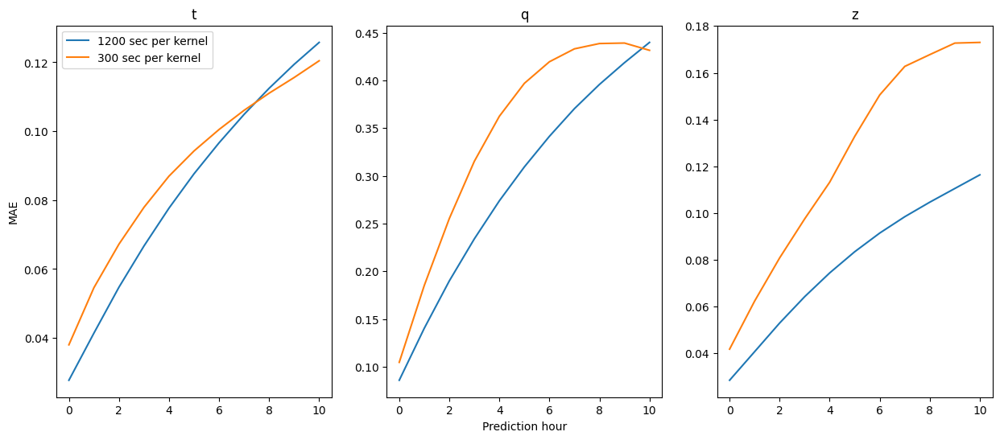

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(1, 3, figsize=(15,6))
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.arange(20)

ax[0].set_title('t')
ax[0].set_ylabel('MAE')
#ax[0].plot(df_u_mae['u_mae_1200_bez'], label='1200 sec')
ax[0].plot(df_t_mae['t_mae_1200'], label='1200 sec per kernel')
#ax[0].plot(df_u_mae['u_mae_300_bez'], label='300 sec')
ax[0].plot(df_t_mae['t_mae_300'], label='300 sec per kernel')

ax[1].set_title('q')
ax[1].set_xlabel('Prediction hour')
#ax[1].plot(df_q_mae['q_mae_1200_bez'], label='Raw PredFormer')
ax[1].plot(df_q_mae['q_mae_1200'], label='PredFormerGFT')
#ax[1].plot(df_q_mae['q_mae_300_bez'], label='Raw PredFormer')
ax[1].plot(df_q_mae['q_mae_300'], label='PredFormerGFT')

ax[2].set_title('z')
#ax[2].plot(df_z_mae['z_mae_1200_bez'], label='Raw PredFormer')
ax[2].plot(df_z_mae['z_mae_1200'], label='PredFormerGFT')
#ax[2].plot(df_z_mae['z_mae_300_bez'], label='Raw PredFormer')
ax[2].plot(df_z_mae['z_mae_300'], label='PredFormerGFT')

ax[0].legend()
fig.savefig('300_vs_1200.png', dpi=150, bbox_inches='tight')
fig.show()

## Сравнение

In [9]:
dict_no_physics = torch.load('checkpoints/imvp_no_physics.results')
dict_pred_rnn = torch.load('checkpoints/pred_rnn_2.results')
dict_simvp = torch.load('checkpoints/sim_vp.results')
dict_raw_pred = torch.load('checkpoints/predformer_raw.results')
dict_weathergft = torch.load('checkpoints/original_small_mae_2004.results')
dict_single = torch.load('checkpoints/single_block_small_mae_2004.results')
dict_pred_two_o = torch.load('checkpoints/predformer_two_o.results')
dict_imvp_physics = torch.load('checkpoints/imvp_ours.results')

In [20]:
print('q1000 6h')
target_id = 4 + 2
hour = 0

print(f"{dict_weathergft['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_single['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_raw_pred['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_no_physics['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_pred_rnn['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_simvp['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_pred_two_o['mistakes_list'][hour, target_id].item():.2f}")
print(f"{dict_imvp_physics['mistakes_list'][hour, target_id].item():.2f}")

q1000 6h
163.35
162.75
84.34
98.57
167.81
158.75
66.98
93.29


In [63]:
print('avg 1h')
hour = 59

std = std.squeeze()
print('std shape:', torch.mean(dict_weathergft['mistakes_list'][hour, :] / std.squeeze()))

print(f"{torch.mean(dict_weathergft['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_single['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_raw_pred['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_no_physics['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_pred_rnn['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_simvp['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_pred_two_o['mistakes_list'][hour, :] / std).item():.2f}")
print(f"{torch.mean(dict_imvp_physics['mistakes_list'][hour, :] / std).item():.2f}")

avg 1h
std shape: tensor(0.3751, dtype=torch.float64)
0.38
0.36
0.32
0.35
0.35
0.33
0.33
0.35


In [12]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

In [74]:
hour = 5
var_id = 30+12 #q1000

data_pairs = []
data_pairs.append((dict_no_physics['y_true_map'][hour, var_id], torch.zeros_like(dict_no_physics['y_true_map'][hour, var_id])))
data_pairs.append((dict_no_physics['predictions_map'][hour, var_id], dict_no_physics['mistakes_map'][hour, var_id]))
data_pairs.append((dict_pred_rnn['predictions_map'][hour, var_id], dict_pred_rnn['mistakes_map'][hour, var_id]))
data_pairs.append((dict_simvp['predictions_map'][hour, var_id], dict_simvp['mistakes_map'][hour, var_id]))
data_pairs.append((dict_raw_pred['predictions_map'][hour, var_id], dict_raw_pred['mistakes_map'][hour, var_id]))
data_pairs.append((dict_weathergft['predictions_map'][hour, var_id], dict_weathergft['mistakes_map'][hour, var_id]))
data_pairs.append((dict_single['predictions_map'][hour, var_id], dict_single['mistakes_map'][hour, var_id]))
data_pairs.append((dict_pred_two_o['predictions_map'][hour, var_id], dict_pred_two_o['mistakes_map'][hour, var_id]))
data_pairs.append((dict_imvp_physics['predictions_map'][hour, var_id], dict_imvp_physics['mistakes_map'][hour, var_id]))

In [10]:
hour = 5
var_id = 43+2 #t150

hour_2 = 11
var_id_2 = 30+12 #q1000



data_quads = []
data_quads.append((dict_no_physics['y_true_map'][hour, var_id], torch.zeros_like(dict_no_physics['y_true_map'][hour, var_id]),
    dict_no_physics['y_true_map'][hour_2, var_id_2], torch.zeros_like(dict_no_physics['y_true_map'][hour_2, var_id_2])))
data_quads.append((dict_no_physics['predictions_map'][hour, var_id], dict_no_physics['mistakes_raw_map'][hour, var_id], 
                   dict_no_physics['predictions_map'][hour_2, var_id_2], dict_no_physics['mistakes_raw_map'][hour_2, var_id_2]))
data_quads.append((dict_pred_rnn['predictions_map'][hour, var_id], dict_pred_rnn['mistakes_raw_map'][hour, var_id], 
                   dict_pred_rnn['predictions_map'][hour_2, var_id_2], dict_pred_rnn['mistakes_raw_map'][hour_2, var_id_2]))

data_quads.append((dict_simvp['predictions_map'][hour, var_id], dict_simvp['mistakes_raw_map'][hour, var_id], 
                   dict_simvp['predictions_map'][hour_2, var_id_2], dict_simvp['mistakes_raw_map'][hour_2, var_id_2]))
data_quads.append((dict_raw_pred['predictions_map'][hour, var_id], dict_raw_pred['mistakes_raw_map'][hour, var_id], 
                   dict_raw_pred['predictions_map'][hour_2, var_id_2], dict_raw_pred['mistakes_raw_map'][hour_2, var_id_2]))
data_quads.append((dict_weathergft['predictions_map'][hour, var_id], dict_weathergft['mistakes_raw_map'][hour, var_id], 
                   dict_weathergft['predictions_map'][hour_2, var_id_2], dict_weathergft['mistakes_raw_map'][hour_2, var_id_2]))
data_quads.append((dict_single['predictions_map'][hour, var_id], dict_single['mistakes_raw_map'][hour, var_id], 
                   dict_single['predictions_map'][hour_2, var_id_2], dict_single['mistakes_raw_map'][hour_2, var_id_2]))
data_quads.append((dict_pred_two_o['predictions_map'][hour, var_id], dict_pred_two_o['mistakes_raw_map'][hour, var_id], 
                   dict_pred_two_o['predictions_map'][hour_2, var_id_2], dict_pred_two_o['mistakes_raw_map'][hour_2, var_id_2]))
data_quads.append((dict_imvp_physics['predictions_map'][hour, var_id], dict_imvp_physics['mistakes_raw_map'][hour, var_id], 
                   dict_imvp_physics['predictions_map'][hour_2, var_id_2], dict_imvp_physics['mistakes_raw_map'][hour_2, var_id_2]))

In [3]:
row_names = ["Real values", "WeatherGFT", "WeatherGFT\nSingle Block", "PredFormer", "IAM4VP", "PredRNN", "SimVP", "PredFormerGFT", "PI-IAM4VP"]

In [4]:
column_titles = ['Prediction, u150, 6 hours', 'Error, u150, 6 hours', 'Prediction, q1000, 12 hours', 'Error, q1000, 12 hours']

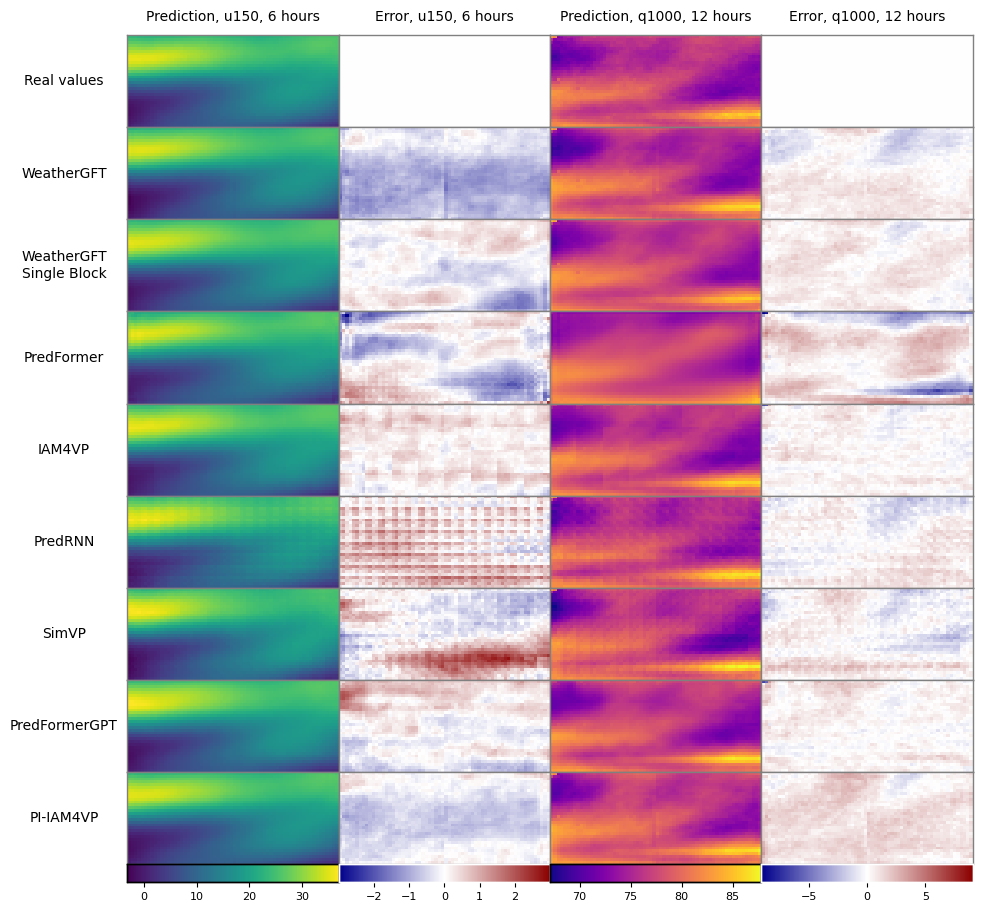

In [19]:
# Create custom diverging colormaps
def make_diverging_cmap(color):
    if color == 'blue':
        colors = ['#8B0000', '#FFFFFF', '#00008B']  # Dark red -> white -> dark blue
    else:  # red
        colors = ['#00008B', '#FFFFFF', '#8B0000']  # Dark blue -> white -> dark red
    return LinearSegmentedColormap.from_list(f'div_{color}', colors)

# Column color schemes
colormaps = [
    'viridis',          # Column 1 (unchanged)
    make_diverging_cmap('red'),  # Column 2
    'plasma',           # Column 3 (unchanged)
    make_diverging_cmap('red')    # Column 4
]

# Create figure
fig = plt.figure(figsize=(12, 11))

# Main GridSpec setup
gs = GridSpec(10, 5, 
             height_ratios=[1]*9 + [0.2], 
             width_ratios=[0.4, 1, 1, 1, 1],
             hspace=0, wspace=0)

# Calculate min/max values for each column
vmins = [min(torch.min(quad[i]).item() for quad in data_quads) for i in range(4)]
vmaxs = [max(torch.max(quad[i]).item() for quad in data_quads) for i in range(4)]

# Adjust ranges for diverging columns (2 & 4)
for i in [1, 3]:
    max_val = max(abs(vmins[i]), abs(vmaxs[i]))
    vmins[i] = -max_val
    vmaxs[i] = max_val

# Create heatmaps
for row_idx, (quad, name) in enumerate(zip(data_quads, row_names)):
    # Row label
    ax_label = fig.add_subplot(gs[row_idx, 0])
    ax_label.text(0.25, 0.5, name, ha='center', va='center', fontsize=10)
    ax_label.axis('off')
    
    # Create each heatmap in the row
    for col_idx in range(4):
        ax = fig.add_subplot(gs[row_idx, col_idx+1])
        sns.heatmap(quad[col_idx].numpy(), 
                   ax=ax, 
                   cbar=False,
                   vmin=vmins[col_idx],
                   vmax=vmaxs[col_idx],
                   cmap=colormaps[col_idx],
                   xticklabels=False,
                   yticklabels=False)
        ax.tick_params(length=0)
        
        # Alternating black/white borders
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('gray')
            spine.set_linewidth(1.0)

# Add column headers
for col_idx, title in enumerate(column_titles):
    header = fig.add_subplot(gs[0, col_idx+1])
    header.text(0.5, 1.2, title, ha='center', va='center', fontsize=10)
    header.axis('off')

# Add horizontal colorbars
for col_idx in range(4):
    cbar_ax = fig.add_subplot(gs[9, col_idx+1])
    sm = plt.cm.ScalarMappable(cmap=colormaps[col_idx],
                              norm=plt.Normalize(vmin=vmins[col_idx], 
                                               vmax=vmaxs[col_idx]))
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
    cbar.ax.tick_params(labelsize=8)
    
    # Matching border style
    border_color = 'black' if col_idx % 2 == 0 else 'white'
    for spine in cbar_ax.spines.values():
        spine.set_visible(True)
        spine.set_color(border_color)
        spine.set_linewidth(1.0)

#plt.suptitle("Four-Column Heatmap with Diverging Colormaps", y=0.98)
plt.savefig("diverging_colormap_grid.png", bbox_inches='tight', dpi=300)
plt.show()

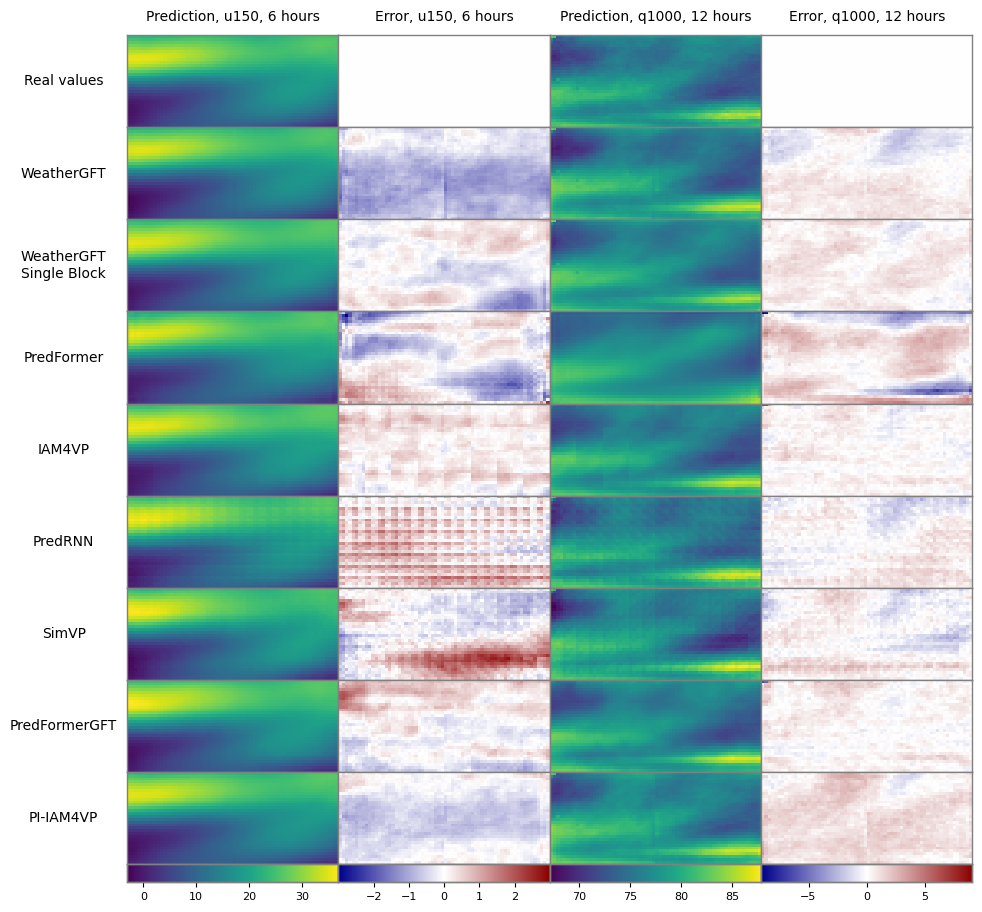

In [13]:
from matplotlib.colors import LinearSegmentedColormap

# Create custom diverging colormaps
def make_diverging_cmap(color):
    if color == 'blue':
        colors = ['#8B0000', '#FFFFFF', '#00008B']  # Dark red -> white -> dark blue
    else:  # red
        colors = ['#00008B', '#FFFFFF', '#8B0000']  # Dark blue -> white -> dark red
    return LinearSegmentedColormap.from_list(f'div_{color}', colors)

# Column color schemes
colormaps = [
    'viridis',          # Column 1 (unchanged)
    make_diverging_cmap('red'),  # Column 2
    'viridis',           # Column 3 (unchanged)
    make_diverging_cmap('red')    # Column 4
]

# Create figure
fig = plt.figure(figsize=(12, 11))

# Main GridSpec setup
gs = GridSpec(10, 5, 
             height_ratios=[1]*9 + [0.2], 
             width_ratios=[0.4, 1, 1, 1, 1],
             hspace=0, wspace=0)

# Calculate min/max values for each column
vmins = [min(torch.min(quad[i]).item() for quad in data_quads) for i in range(4)]
vmaxs = [max(torch.max(quad[i]).item() for quad in data_quads) for i in range(4)]

# Adjust ranges for diverging columns (2 & 4)
for i in [1, 3]:
    max_val = max(abs(vmins[i]), abs(vmaxs[i]))
    vmins[i] = -max_val
    vmaxs[i] = max_val

# Create heatmaps
for row_idx, (quad, name) in enumerate(zip(data_quads, row_names)):
    # Row label
    ax_label = fig.add_subplot(gs[row_idx, 0])
    ax_label.text(0.25, 0.5, name, ha='center', va='center', fontsize=10)
    ax_label.axis('off')
    
    # Create each heatmap in the row
    for col_idx in range(4):
        ax = fig.add_subplot(gs[row_idx, col_idx+1])
        sns.heatmap(quad[col_idx].numpy(), 
                   ax=ax, 
                   cbar=False,
                   vmin=vmins[col_idx],
                   vmax=vmaxs[col_idx],
                   cmap=colormaps[col_idx],
                   xticklabels=False,
                   yticklabels=False)
        ax.tick_params(length=0)
        
        # Alternating black/white borders
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('gray')
            spine.set_linewidth(1.0)

# Add column headers
for col_idx, title in enumerate(column_titles):
    header = fig.add_subplot(gs[0, col_idx+1])
    header.text(0.5, 1.2, title, ha='center', va='center', fontsize=10)
    header.axis('off')

# Add horizontal colorbars
for col_idx in range(4):
    cbar_ax = fig.add_subplot(gs[9, col_idx+1])
    sm = plt.cm.ScalarMappable(cmap=colormaps[col_idx],
                              norm=plt.Normalize(vmin=vmins[col_idx], 
                                               vmax=vmaxs[col_idx]))
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
    cbar.ax.tick_params(labelsize=8)
    
    # Matching border style
    border_color = 'black' if col_idx % 2 == 0 else 'white'
    for spine in cbar_ax.spines.values():
        spine.set_visible(True)
        spine.set_color('gray')
        spine.set_linewidth(1.0)

#plt.suptitle("Four-Column Heatmap with Diverging Colormaps", y=0.98)
plt.savefig("diverging_colormap_grid.png", bbox_inches='tight', dpi=300)
plt.show()

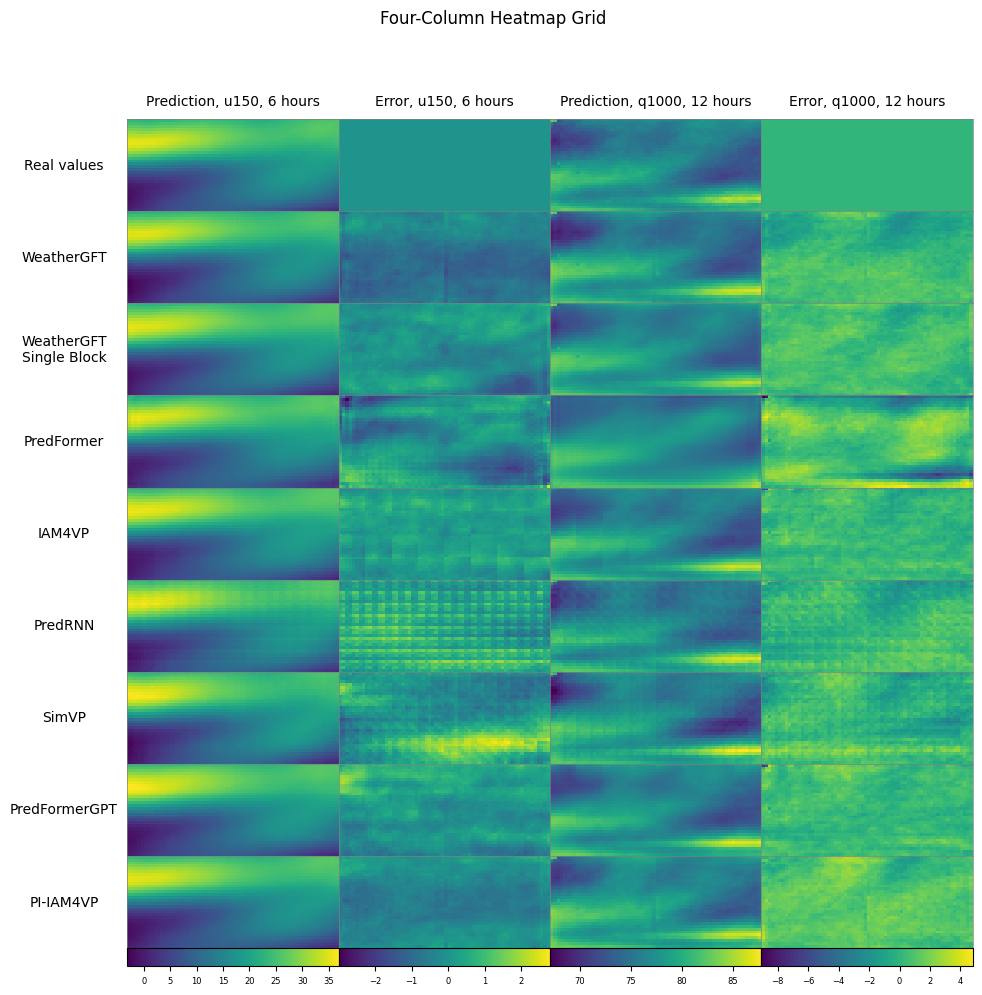

In [100]:
# Create figure with adjusted size (wider for 4 columns)
fig = plt.figure(figsize=(12, 11))

# Main GridSpec: 10 rows (9 heatmap rows + 1 colorbar row), 5 columns
# [labels | heatmap1 | heatmap2 | heatmap3 | heatmap4]
gs = GridSpec(10, 5, height_ratios=[1]*9 + [0.2], 
              width_ratios=[0.4, 1, 1, 1, 1],  # Narrower label column
              hspace=0, wspace=0)

# Find min/max for each column
vmins = [min(torch.min(quad[i]).item() for quad in data_quads) for i in range(4)]
vmaxs = [max(torch.max(quad[i]).item() for quad in data_quads) for i in range(4)]

# Create heatmaps
for row_idx, (quad, name) in enumerate(zip(data_quads, row_names)):
    # Row label
    ax_label = fig.add_subplot(gs[row_idx, 0])
    ax_label.text(0.25, 0.5, name, ha='center', va='center', fontsize=10)
    ax_label.axis('off')
    
    # Create each heatmap in the row
    for col_idx in range(4):
        ax = fig.add_subplot(gs[row_idx, col_idx+1])  # +1 to skip label column
        sns.heatmap(quad[col_idx].numpy(), ax=ax, cbar=False, 
                   vmin=vmins[col_idx], vmax=vmaxs[col_idx],
                   cmap='viridis', xticklabels=False, yticklabels=False)
        ax.tick_params(length=0)
        
        # Add separating lines
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('gray')
            spine.set_linewidth(0.5)

# Add column headers
for col_idx, title in enumerate(column_titles):
    header = fig.add_subplot(gs[0, col_idx+1])  # +1 to skip label column
    header.text(0.5, 1.2, title, ha='center', va='center', fontsize=10)
    header.axis('off')

# Add horizontal colorbars for each column
for col_idx in range(4):
    cbar_ax = fig.add_subplot(gs[9, col_idx+1])  # +1 to skip label column
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=vmins[col_idx], vmax=vmaxs[col_idx]))
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
    cbar.ax.tick_params(labelsize=6)

plt.suptitle("Four-Column Heatmap Grid", y=0.98)
plt.savefig("four_column_heatmap_grid.png", bbox_inches='tight', dpi=300)
plt.show()

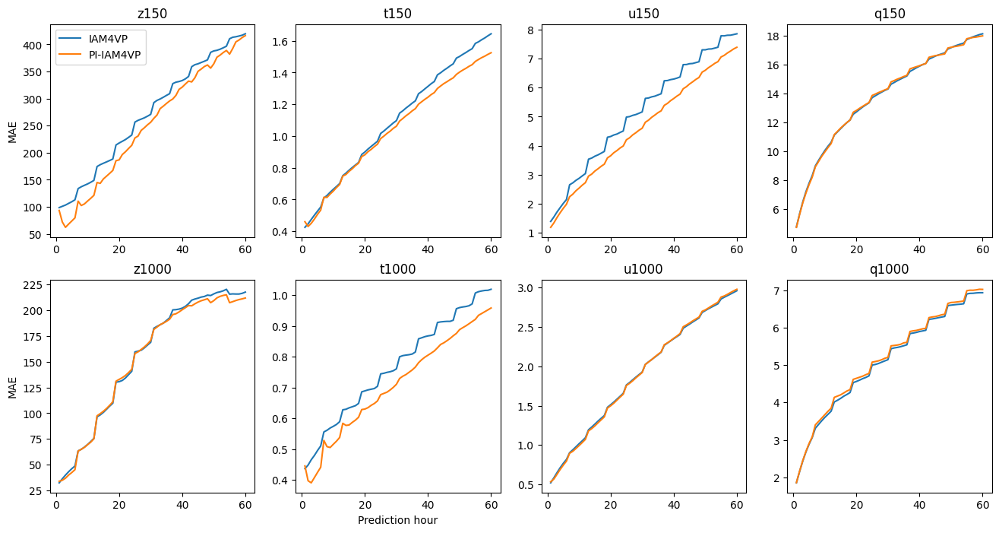

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(2, 4, figsize=(16,8))
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.arange(60)  # np.arange(24)

ax[0][0].set_title('z150')
ax[0][0].set_ylabel('MAE')
ax[0][0].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 4 + 2], label='IAM4VP')
ax[0][0].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 4 + 2], label='PI-IAM4VP')
#ax[0][0].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 4 + 2], label='PredRNN')
#ax[0][0].plot(ids + 1, dict_simvp['mistakes_list'][ids, 4 + 2], label='SimVP')


ax[0][1].set_title('t150')
ax[0][1].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 17 + 2], label='IAM4VP')
ax[0][1].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 17 + 2], label='PI-IAM4VP')
#ax[0][1].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 17 + 2], label='PredRNN')
#ax[0][1].plot(ids + 1, dict_simvp['mistakes_list'][ids, 17 + 2], label='SimVP')


ax[0][2].set_title('u150')
ax[0][2].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 43 + 2], label='IAM4VP')
ax[0][2].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 43 + 2], label='PI-IAM4VP')
#ax[0][2].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 43 + 2], label='PredRNN')
#ax[0][2].plot(ids + 1, dict_simvp['mistakes_list'][ids, 43 + 2], label='SimVP')

ax[0][3].set_title('q150')
ax[0][3].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 30 + 2], label='IAM4VP')
ax[0][3].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 30 + 2], label='PI-IAM4VP')
#ax[0][3].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 30 + 2], label='PredRNN')
#ax[0][3].plot(ids + 1, dict_simvp['mistakes_list'][ids, 30 + 2], label='SimVP')


ax[1][0].set_title('z1000')
ax[1][0].set_ylabel('MAE')
ax[1][0].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 4 + 12], label='IAM4VP')
ax[1][0].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 4 + 12], label='PI-IAM4VP')
#ax[1][0].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 4 + 12], label='PredRNN')
#ax[1][0].plot(ids + 1, dict_simvp['mistakes_list'][ids, 4 + 12], label='SimVP')


ax[1][1].set_title('t1000')
ax[1][1].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 17 + 12], label='IAM4VP')
ax[1][1].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 17 + 12], label='PI-IAM4VP')
#ax[1][1].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 17 + 12], label='PredRNN')
#ax[1][1].plot(ids + 1, dict_simvp['mistakes_list'][ids, 17 + 12], label='SimVP')
ax[1][1].set_xlabel('Prediction hour')

ax[1][2].set_title('u1000')
ax[1][2].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 43 + 12], label='IAM4VP')
ax[1][2].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 43 + 12], label='PI-IAM4VP')
#ax[1][2].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 43 + 12], label='PredRNN')
#ax[1][2].plot(ids + 1, dict_simvp['mistakes_list'][ids, 43 + 12], label='SimVP')

ax[1][3].set_title('q1000')
ax[1][3].plot(ids + 1, dict_no_physics['mistakes_list'][ids, 30 + 12], label='IAM4VP')
ax[1][3].plot(ids + 1, dict_imvp_physics['mistakes_list'][ids, 30 + 12], label='PI-IAM4VP')
#ax[1][3].plot(ids + 1, dict_pred_rnn['mistakes_list'][ids, 30 + 12], label='PredRNN')
#ax[1][3].plot(ids + 1, dict_simvp['mistakes_list'][ids, 30 + 12], label='SimVP')

ax[0][0].legend()
fig.savefig('imvp_vs_pimvp.png', dpi=150, bbox_inches='tight')
fig.show()

## IAM4VP Physics

In [18]:
from Models.imvp_v2_small_world import IAM4VP

torch_model = IAM4VP()

In [19]:
ckpt = torch.load('/home/ebugaev/checkpoints/f train_imvp_mini_gft small world/2025-05-06-06:39yse0y/epoch=19-val_loss=0.1004.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [ ]:
from torch.nn.functional import l1_loss, mse_loss
import tqdm 

complete_cycles = 10
timestep = 6

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    skip_time = 0
    
    for x, y in tqdm.tqdm(valid_loader_subset_2004):
        y = y.to(device) * std + mean    
        
        x = x.to(device)
        cnt_list += 1
                    
        for i in range(complete_cycles): 
            pred_list = []
            for j in range(6):
                t = torch.tensor((j + 1) * 100).repeat(x.shape[0]).to(device)
                prediction = torch_model(x, pred_list, t)
            
                pred_list.append(prediction)
                
            for j in range(6):
                pred_list[j] = pred_list[j].unsqueeze(1)
                
            pred = torch.cat(pred_list, axis=1)
            
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            print('timestep i:', timestep * i)
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            
            x = pred[:, -6:, ...]
            
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

In [21]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/imvp_ours_long.results')

In [26]:
print(mistakes_list[:, 17+7])

tensor([0.5740, 0.4272, 0.4007, 0.4215, 0.4448, 0.4679, 0.6204, 0.5479, 0.5460,
        0.5643, 0.5836, 0.5998, 0.6924, 0.6630, 0.6731, 0.6905, 0.7084, 0.7226,
        0.7781, 0.7781, 0.7952, 0.8138, 0.8318, 0.8453, 0.8734, 0.8968, 0.9184,
        0.9359, 0.9529, 0.9638, 0.9716, 1.0071, 1.0291, 1.0452, 1.0597, 1.0688,
        1.0670, 1.1079, 1.1325, 1.1492, 1.1646, 1.1736, 1.1623, 1.2111, 1.2365,
        1.2533, 1.2676, 1.2750, 1.2522, 1.3014, 1.3241, 1.3376, 1.3483, 1.3533,
        1.3286, 1.3764, 1.3988, 1.4128, 1.4243, 1.4301])


## PredRNN

In [21]:
from Data.weatherbench_128_v3 import WeatherBench128
from torch.utils.data import DataLoader

val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-30 00:00:00' # '2004-01-01 23:00:00' #

valid_data_2004 = WeatherBench128(start_time=val_start_time, end_time=val_end_time,
                                include_target=False,
                                lead_time=1, 
                                interval=1,
                                muti_target_steps=1,
                                start_time_x=0,
                                end_time_x=11,      
                                start_time_y=12,
                                end_time_y=71, 
                                cut=[[128 - 92, 128 - 60], [256 - 131, 256 - 67]]
                                )  
    
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=16, shuffle=False, num_workers=8)

In [22]:
from torch.utils.data import Subset

indices = list(range(0, len(valid_data_2004), 19))
valid_data_subset_2004 = Subset(valid_data_2004, indices)

valid_loader_subset_2004 = DataLoader(valid_data_subset_2004, batch_size=8, shuffle=True, num_workers=4)

In [23]:
from Models.PredRNN import PredRNN_Model

config = {
        'in_shape': (12, 69, 32, 64), 
        'patch_size': 1, 
        'filter_size': 3, 
        'stride': 1, 
        'layer_norm': True,
        'pre_seq_length': 12, 
        'aft_seq_length': 12, 
        'reverse_scheduled_sampling': 0,
    }
    
torch_model = PredRNN_Model(num_layers=4, num_hidden=(128, 128, 128, 128), configs=config)

In [31]:
ckpt = torch.load('/home/ebugaev/checkpoints/PredRNN/2025-05-13-16:46fpnm5/epoch=03-val_loss=0.1834.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [32]:
from torch.nn.functional import l1_loss, mse_loss
import tqdm 

complete_cycles = 5
timestep = 12

key_ind = np.arange(0, 69)
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    
    for pred, y in tqdm.tqdm(valid_loader_subset_2004):
        y = y.to(device) * std + mean    
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):        
            
            inp = torch.cat((pred, torch.zeros_like(pred)), axis=1).to(device)
            inp = inp.permute(0, 1, 3, 4, 2).contiguous()
            pred, _ = torch_model(inp, torch.zeros(1, 12, 1, 1, 1).to(device))
            pred = pred.permute(0, 1, 4, 2, 3)[:, -12:, ...]
            
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

100%|██████████| 58/58 [12:23<00:00, 12.82s/it] 


In [34]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/pred_rnn_2.results')

## SimVP

In [37]:
from Data.weatherbench_128_v3 import WeatherBench128
from torch.utils.data import DataLoader

val_start_time = '2004-01-01 00:00:00'
val_end_time = '2004-12-30 00:00:00' # '2004-01-01 23:00:00' #

valid_data_2004 = WeatherBench128(start_time=val_start_time, end_time=val_end_time,
                                include_target=False,
                                lead_time=1, 
                                interval=1,
                                muti_target_steps=1,
                                start_time_x=0,
                                end_time_x=11,      
                                start_time_y=12,
                                end_time_y=71, 
                                cut=[[128 - 92, 128 - 60], [256 - 131, 256 - 67]]
                                )  
    
valid_loader_2004 = DataLoader(valid_data_2004, batch_size=16, shuffle=False, num_workers=8)

from torch.utils.data import Subset

indices = list(range(0, len(valid_data_2004), 19))
valid_data_subset_2004 = Subset(valid_data_2004, indices)

valid_loader_subset_2004 = DataLoader(valid_data_subset_2004, batch_size=8, shuffle=True, num_workers=4)

In [38]:
from Models.SimVP import SimVP_Model

torch_model = SimVP_Model(in_shape=(12, 69, 32, 64))

In [39]:
ckpt = torch.load('/home/ebugaev/checkpoints/SimVP/2025-05-10-04:02qz2lp/epoch=08-val_loss=0.1987.ckpt', map_location=torch.device('cpu'))
weights = {}
for key in ckpt['state_dict']: 
    weights[key[6:]] = ckpt['state_dict'][key]
# weights = ckpt

torch_model.load_state_dict(weights, strict=True)
print('[complete loading model]')
torch_model = torch_model.to(device)

[complete loading model]


In [40]:
from torch.nn.functional import l1_loss, mse_loss

complete_cycles = 5
timestep = 12

key_ind = np.arange(0, 69) # t2m, u10, z500, t850
    
with torch.no_grad():
    mistakes_list = torch.zeros((timestep * complete_cycles, 69))
    mistakes_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    mistakes_raw_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    predictions_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))
    y_true_map = torch.zeros((timestep * complete_cycles, 69, 32, 64))

    cnt_list = 0        
    
    for pred, y in tqdm.tqdm(valid_loader_subset_2004):
        y = y.to(device) * std + mean    
        
        pred = pred.to(device)
        cnt_list += 1
        for i in range(complete_cycles):                
            pred = torch_model(pred)
            real_pred = (pred * std + mean)
            real_y = y[:, timestep * i:timestep * (i + 1), ...]
            diff = torch.mean(torch.abs(real_pred - real_y), axis=0)
            diff_no_abs = torch.mean(real_pred - real_y, axis=0)
            
            
            mistakes_list[timestep * i:timestep * (i + 1), ...] += torch.mean(diff, axis=(-1, -2)).cpu()
            predictions_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_pred, axis=0).cpu()
            y_true_map[timestep * i:timestep * (i + 1), ...] += torch.mean(real_y, axis=0).cpu()
            mistakes_map[timestep * i:timestep * (i + 1), ...] += diff.cpu()
            mistakes_raw_map[timestep * i:timestep * (i + 1), ...] += diff_no_abs.cpu()
            

mistakes_list /= cnt_list
mistakes_map /= cnt_list
predictions_map /= cnt_list
y_true_map /= cnt_list
mistakes_raw_map /= cnt_list

100%|██████████| 58/58 [08:51<00:00,  9.17s/it]


In [41]:
dict_validation_original = {'mistakes_list': mistakes_list, 'mistakes_map': mistakes_map, 'predictions_map': predictions_map, 'y_true_map': y_true_map, 'mistakes_raw_map': mistakes_raw_map}
torch.save(dict_validation_original, 'checkpoints/sim_vp.results')

## Предсказание input'ом

In [48]:
from Data.weatherbench_128 import WeatherBench128
from torch.utils.data import DataLoader

valid_data_2018 = WeatherBench128(start_time='2018-01-01 00:00:00', end_time='2018-12-25 00:00:00',
                                include_target=False, lead_time=1, interval=47, muti_target_steps=24)
valid_loader_2018 = DataLoader(valid_data_2018, batch_size=1, shuffle=False, num_workers=4)

In [32]:
def constant_model(input_tensor):
    input_tensor = input_tensor.unsqueeze(1)
    target_shape = list(input_tensor.shape)
    target_shape[1] = 6
    return torch.broadcast_to(input_tensor, target_shape)

In [50]:
constant_mistakes_2018, constant_mistakes_map_2018, constant_pred_map_2018, constant_y_real_map_2018 = \
    get_validation_accuracy(constant_model, valid_loader_2018, complete_cycles=4)

100%|██████████| 183/183 [02:18<00:00,  1.32it/s]


In [51]:
dict_constant_mistakes_2018 = {'t2m': constant_mistakes_2018[0], 'u10': constant_mistakes_2018[1], 'z500': constant_mistakes_2018[2], 't850': constant_mistakes_2018[3]}
dict_constant_maps_2018 = {'mistakes': constant_mistakes_map_2018, 'pred': constant_pred_map_2018, 'real': constant_y_real_map_2018}

torch.save(dict_constant_maps_2018, 'checkpoints/constant_prediction_maps_2018.results')
torch.save(dict_constant_mistakes_2018, 'checkpoints/constant_prediction_mistakes_2018.results')

In [33]:
constant_mistakes_2004, constant_mistakes_map_2004, constant_pred_map_2004, constant_y_real_map_2004 = \
    get_validation_accuracy(constant_model, valid_loader_2004, complete_cycles=4)

100%|██████████| 184/184 [02:05<00:00,  1.47it/s]


In [34]:
dict_constant_mistakes_2004 = {'t2m': constant_mistakes_2004[0], 'u10': constant_mistakes_2004[1], 'z500': constant_mistakes_2004[2], 't850': constant_mistakes_2004[3]}
dict_constant_maps_2004 = {'mistakes': constant_mistakes_map_2004, 'pred': constant_pred_map_2004, 'real': constant_y_real_map_2004}

torch.save(dict_constant_maps_2004, 'checkpoints/constant_prediction_maps_2004.results')
torch.save(dict_constant_mistakes_2004, 'checkpoints/constant_prediction_mistakes_2004.results')

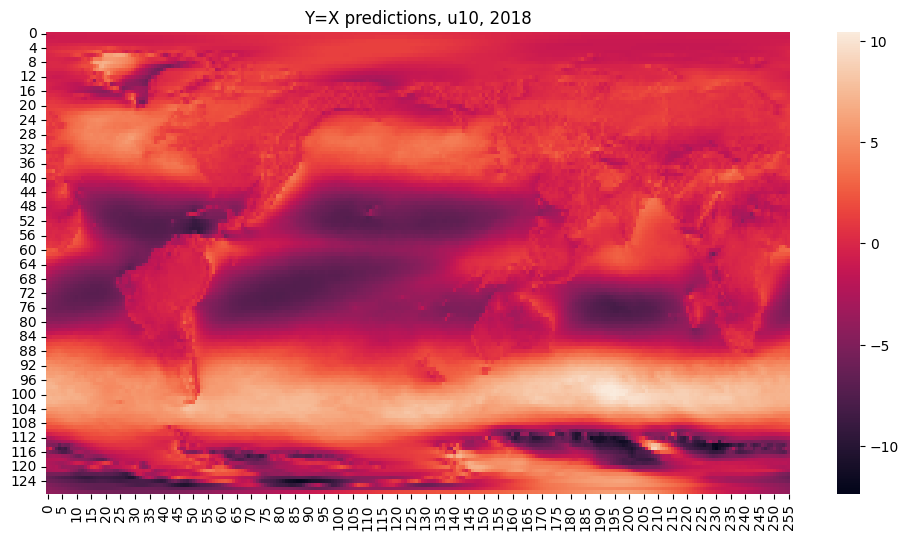

In [61]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(constant_pred_map_2018[1], dims=(0, 1)), ax=ax)
plt.title('Y=X predictions, u10, 2018')
plt.show()

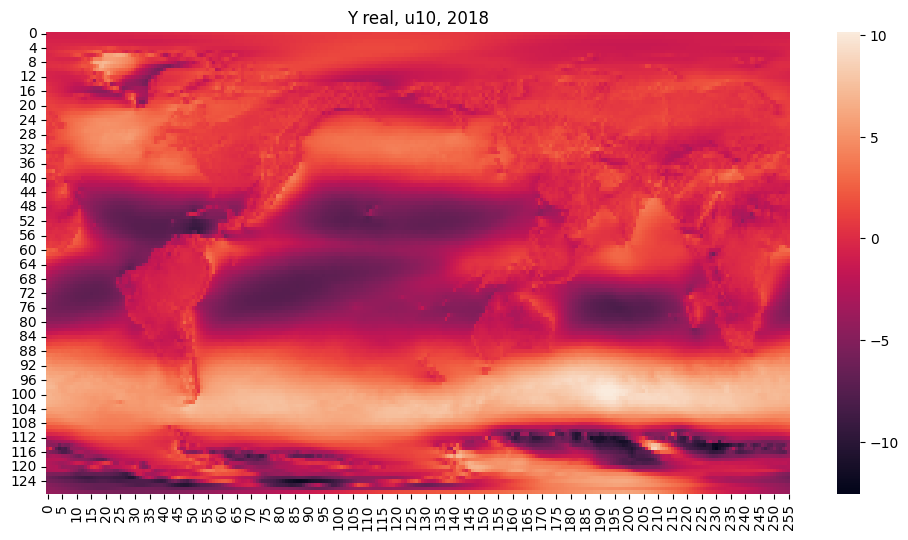

In [59]:
fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(constant_y_real_map_2018[1], dims=(0, 1)), ax=ax)
plt.title('Y real, u10, 2018')
plt.show()

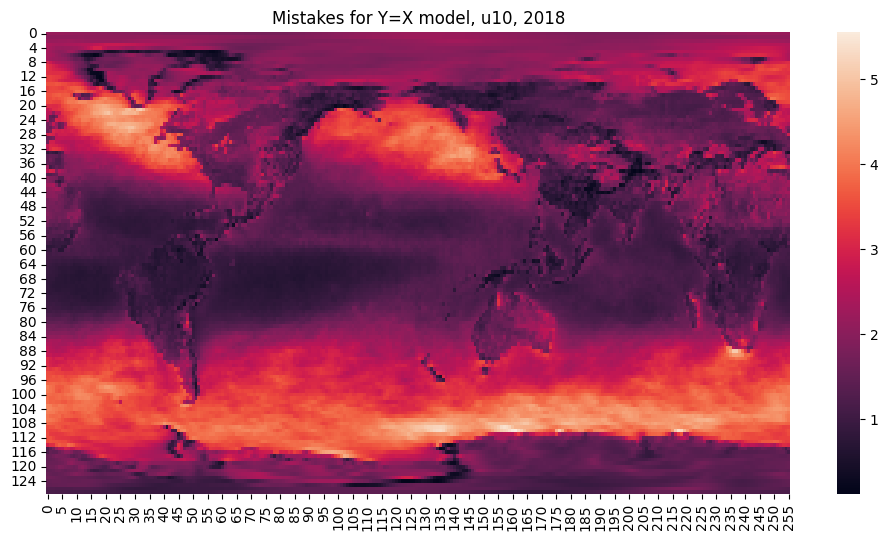

In [60]:
fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(constant_mistakes_map_2018[1], dims=(0, 1)), ax=ax)
plt.title('Mistakes for Y=X model, u10, 2018')
plt.show()

## Сравнение результатов

In [14]:
dict_raw_pf = torch.load('checkpoints/predformer_raw.results')
dict_sec_pf = torch.load('checkpoints/predformer_two_o.results')

In [98]:
print(dict_raw_pf['mistakes_list'][:, 4+7])

tensor([ 51.6503,  53.3450,  54.6934,  55.9308,  57.5561,  59.0606,  61.0036,
         62.6880,  64.4476,  66.4707,  68.7038,  72.1592,  87.8717,  90.0640,
         91.6252,  93.2577,  95.2396,  97.2160,  99.8012, 102.3230, 104.9194,
        107.7305, 110.4552, 114.0068, 136.0000, 138.6035, 139.6870, 141.4930,
        143.6957, 146.2130, 149.3800, 152.1570, 154.9031, 157.9960, 160.5227,
        163.4910, 185.8401, 188.5780, 189.2340, 190.9668, 192.9445, 195.4255,
        198.3404, 201.3733, 204.1854, 206.9639, 209.1362, 211.8910, 231.3424,
        233.2268, 233.5181, 234.4324, 235.8845, 237.7332, 239.9898, 242.8387,
        245.0332, 246.7468, 248.4368, 250.1558])


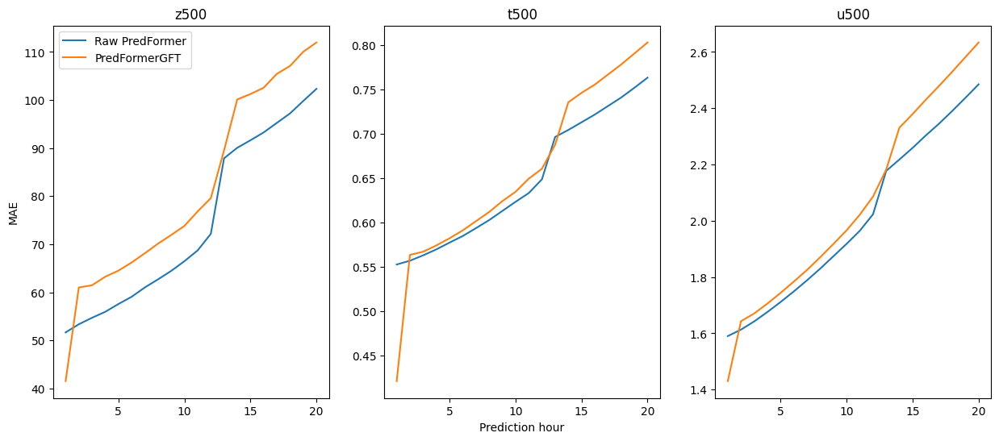

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

fig, ax = plt.subplots(1, 3, figsize=(15,6))
# 4 + 7 -> z500, 17 + 7 -> t500, 43 + 7 -> u500

ids = np.arange(20)

ax[0].set_title('z500')
ax[0].set_ylabel('MAE')
ax[0].plot(ids + 1, dict_raw_pf['mistakes_list'][ids, 4 + 7], label='Raw PredFormer')
ax[0].plot(ids + 1, dict_sec_pf['mistakes_list'][ids, 4 + 7], label='PredFormerGFT')

ax[1].set_title('t500')
ax[1].set_xlabel('Prediction hour')
ax[1].plot(ids + 1, dict_raw_pf['mistakes_list'][ids, 17 + 7], label='Raw PredFormer')
ax[1].plot(ids + 1, dict_sec_pf['mistakes_list'][ids, 17 + 7], label='PredFormerGFT')

ax[2].set_title('u500')
ax[2].plot(ids + 1, dict_raw_pf['mistakes_list'][ids, 43 + 7], label='Raw PredFormer')
ax[2].plot(ids + 1, dict_sec_pf['mistakes_list'][ids, 43 + 7], label='PredFormerGFT')

ax[0].legend()
fig.savefig('quality_predformers.png', dpi=150, bbox_inches='tight')
fig.show()

## Оригинальная модель: исследование

In [27]:
dict_validation_original_maps = torch.load('checkpoints/original_maps.results', map_location='cpu')

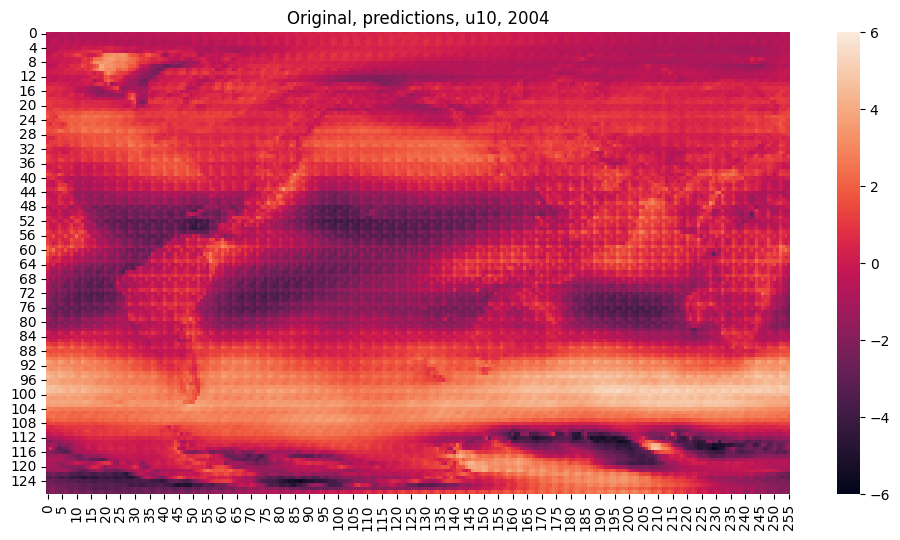

In [139]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_original_maps['pred'][1], dims=(0, 1)), vmin=-6, vmax=6, ax=ax)
plt.title('Original, predictions, u10, 2004')
plt.show()

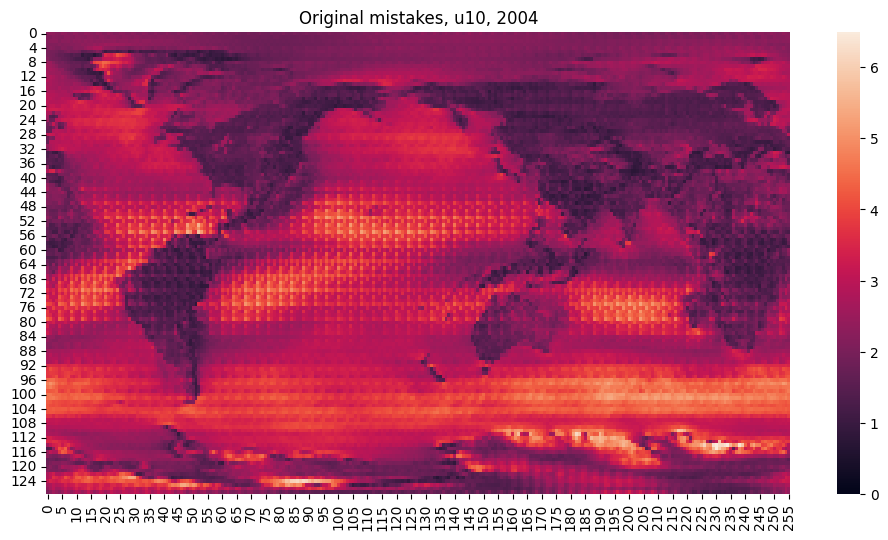

In [179]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_original_maps['mistakes'][1], dims=(0, 1)), vmin=0, vmax=6.5, ax=ax)
plt.title('Original mistakes, u10, 2004')
plt.show()

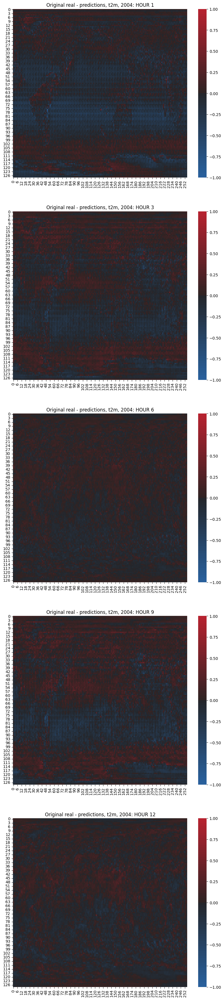

In [29]:
import seaborn as sns

fig, ax = plt.subplots(5, 1, figsize=(10, 45))

cmap = sns.diverging_palette(250, 10, s=85, l=40, n=70, center="dark")

for id, hour in enumerate([0, 2, 5, 8, 11]): 
    sns.heatmap(torch.flip(dict_validation_original_maps['real'][1, hour] - dict_validation_original_maps['pred'][1, hour], dims=(0, 1)), cmap=cmap, vmin=-1, vmax=1, ax=ax[id])
    ax[id].set_title('Original real - predictions, t2m, 2004: HOUR ' + str(hour + 1))

plt.show()

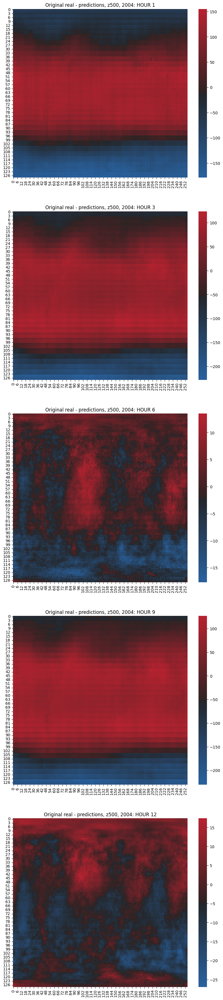

In [30]:
import seaborn as sns

fig, ax = plt.subplots(5, 1, figsize=(10, 45))

cmap = sns.diverging_palette(250, 10, s=85, l=40, n=70, center="dark")

for id, hour in enumerate([0, 2, 5, 8, 11]): 
    sns.heatmap(torch.flip(dict_validation_original_maps['real'][2, hour] - dict_validation_original_maps['pred'][2, hour], dims=(0, 1)), cmap=cmap, ax=ax[id])
    ax[id].set_title('Original real - predictions, z500, 2004: HOUR ' + str(hour + 1))

plt.show()

### Карты - физика 0.5 коэффициент

In [8]:
dict_validation_coef_05_maps = torch.load('checkpoints/physical_05_validation_maps.results', map_location='cpu')

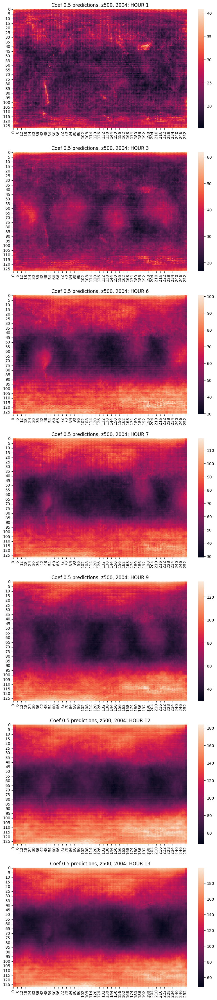

In [14]:
import seaborn as sns

fig, ax = plt.subplots(7, 1, figsize=(10, 45))

for id, hour in enumerate([0, 2, 5, 6, 8, 11, 12]): 
    sns.heatmap(torch.flip(dict_validation_coef_05_mapsion_coef_05_maps['mistakes'][2, hour], dims=(0, 1)), ax=ax[id])
    ax[id].set_title('Coef 0.5 predictions, z500, 2004: HOUR ' + str(hour + 1))

plt.show()

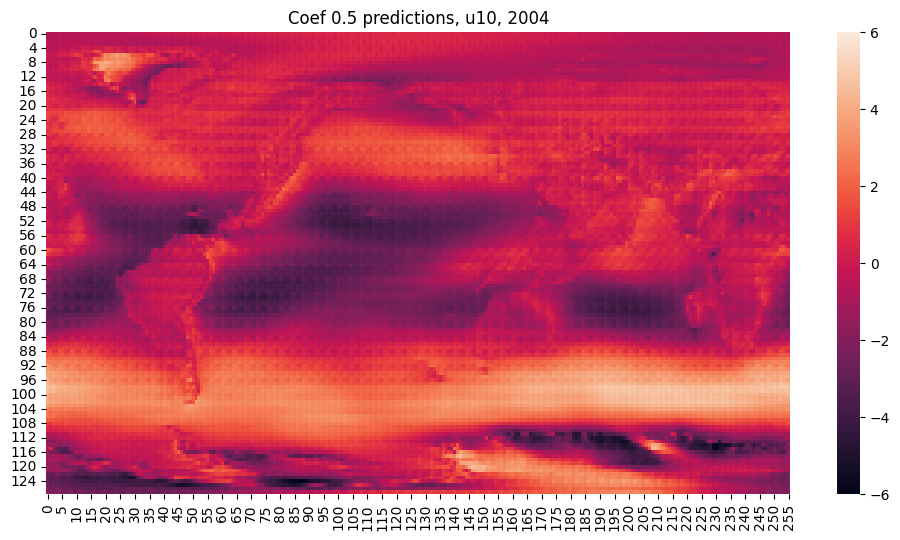

In [176]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_05_maps['pred'][1], dims=(0, 1)), vmin=-6, vmax=6, ax=ax)
plt.title('Coef 0.5 predictions, u10, 2004')
plt.show()

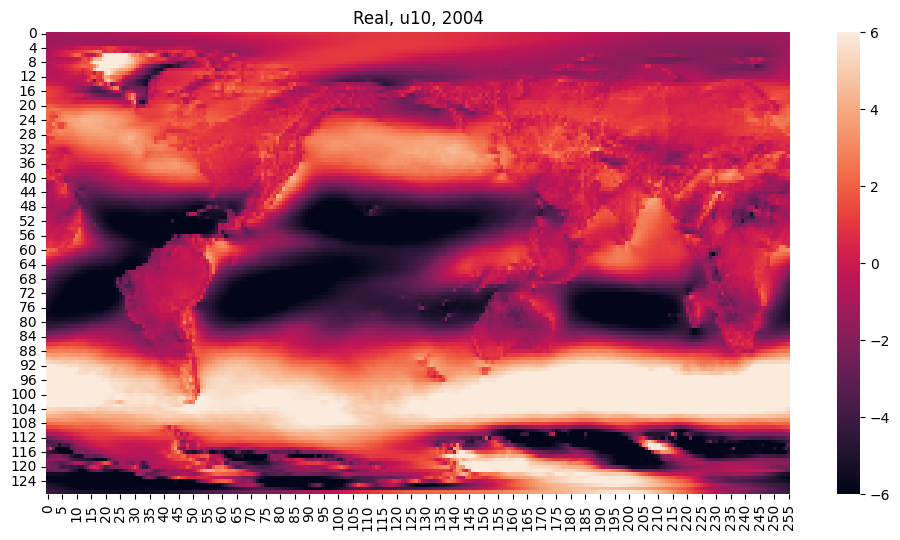

In [127]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_05_maps['real'][1], dims=(0, 1)), vmin=-6, vmax=6, ax=ax)
plt.title('Real, u10, 2004')
plt.show()

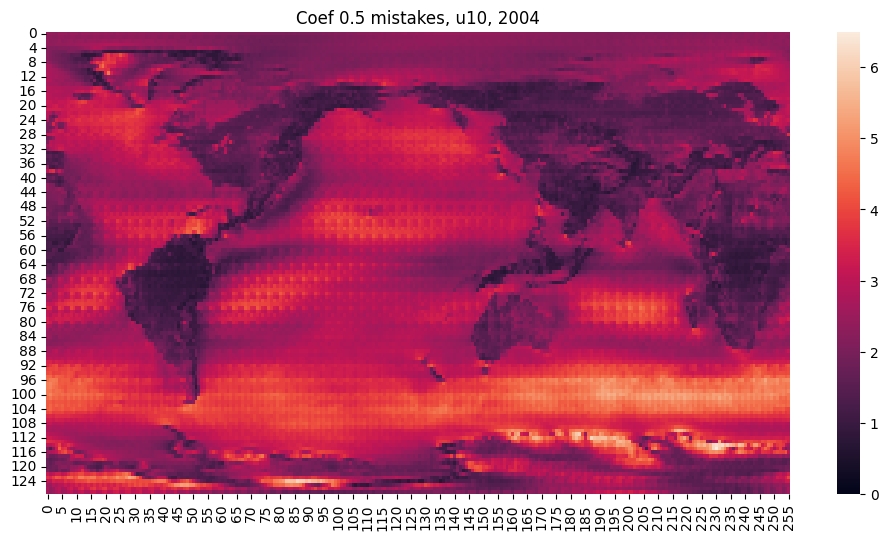

In [177]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_05_maps['mistakes'][1], dims=(0, 1)), vmin=0, vmax=6.5, ax=ax)
plt.title('Coef 0.5 mistakes, u10, 2004')
plt.show()

### Карты - физика 0.1

In [14]:
dict_validation_coef_01_maps = torch.load('checkpoints/physical_01_validation_maps.results', map_location='cpu')

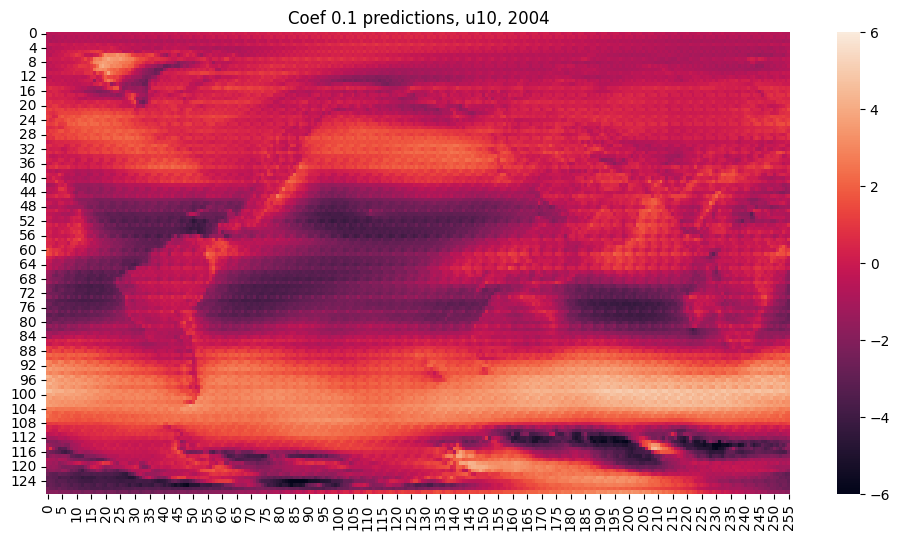

In [181]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_01_maps['pred'][1], dims=(0, 1)), vmin=-6, vmax=6, ax=ax)
plt.title('Coef 0.1 predictions, u10, 2004')
plt.show()

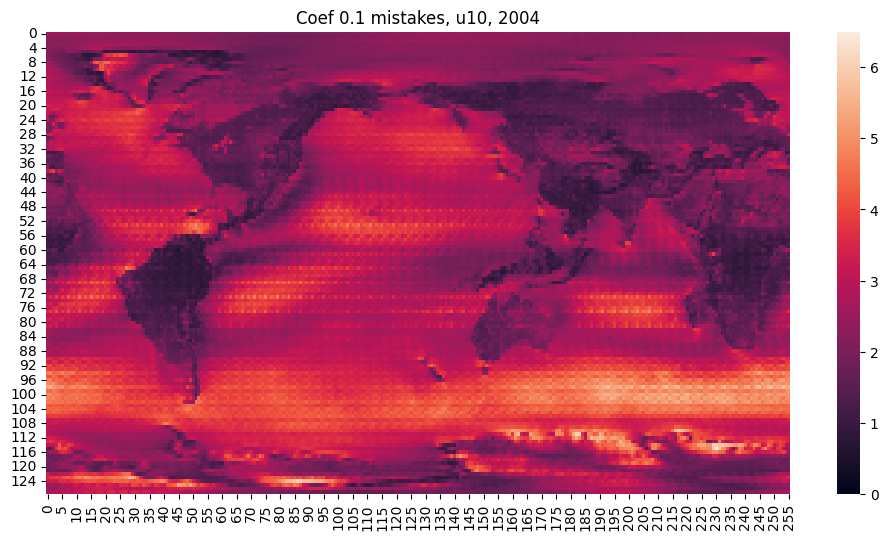

In [182]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_01_maps['mistakes'][1], dims=(0, 1)), vmin=0, vmax=6.5, ax=ax)
plt.title('Coef 0.1 mistakes, u10, 2004')
plt.show()

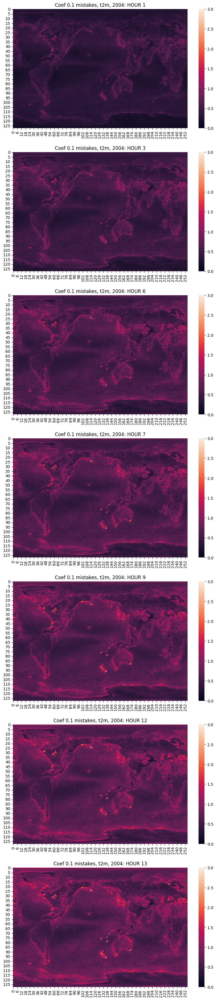

In [15]:
import seaborn as sns

fig, ax = plt.subplots(7, 1, figsize=(10, 45))

for id, hour in enumerate([0, 2, 5, 6, 8, 11, 12]): 
    sns.heatmap(torch.flip(dict_validation_coef_01_maps['mistakes'][1, hour], dims=(0, 1)), vmin=0, vmax=3, ax=ax[id])
    ax[id].set_title('Coef 0.1 mistakes, t2m, 2004: HOUR ' + str(hour + 1))

plt.show()

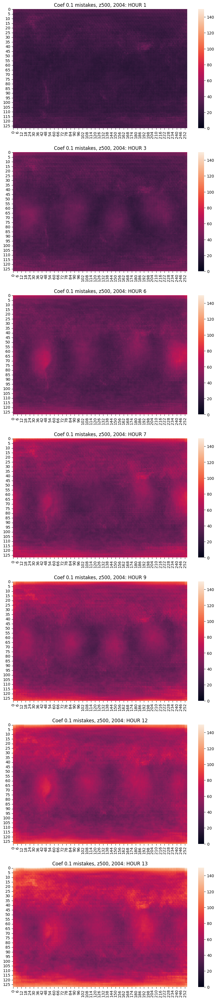

In [16]:
import seaborn as sns

fig, ax = plt.subplots(7, 1, figsize=(10, 45))

for id, hour in enumerate([0, 2, 5, 6, 8, 11, 12]): 
    sns.heatmap(torch.flip(dict_validation_coef_01_maps['mistakes'][2, hour], dims=(0, 1)), vmin=0, vmax=150, ax=ax[id])
    ax[id].set_title('Coef 0.1 mistakes, z500, 2004: HOUR ' + str(hour + 1))

plt.show()

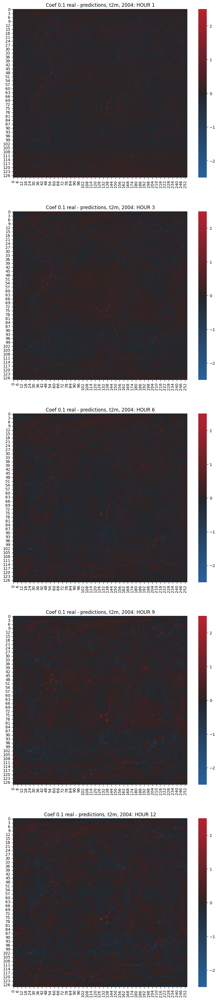

In [25]:
import seaborn as sns

fig, ax = plt.subplots(5, 1, figsize=(10, 45))

cmap = sns.diverging_palette(250, 10, s=85, l=40, n=70, center="dark")

for id, hour in enumerate([0, 2, 5, 8, 11]): 
    sns.heatmap(torch.flip(dict_validation_coef_01_maps['real'][1, hour] - dict_validation_coef_01_maps['pred'][1, hour], dims=(0, 1)), cmap=cmap, vmin=-2.5, vmax=2.5, ax=ax[id])
    ax[id].set_title('Coef 0.1 real - predictions, t2m, 2004: HOUR ' + str(hour + 1))

plt.show()

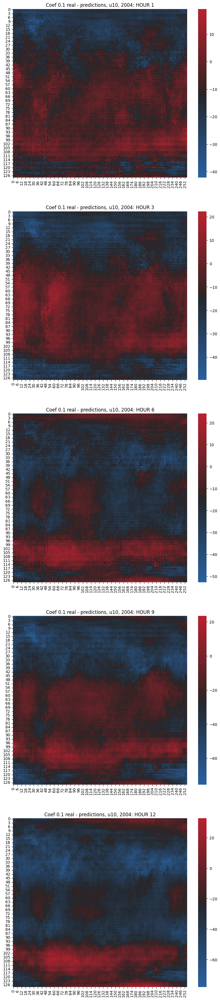

In [32]:
import seaborn as sns

fig, ax = plt.subplots(5, 1, figsize=(10, 45))

cmap = sns.diverging_palette(250, 10, s=85, l=40, n=70, center="dark")

for id, hour in enumerate([0, 2, 5, 8, 11]): 
    sns.heatmap(torch.flip(dict_validation_coef_01_maps['real'][2, hour] - dict_validation_coef_01_maps['pred'][2, hour], dims=(0, 1)), cmap=cmap, ax=ax[id])
    ax[id].set_title('Coef 0.1 real - predictions, u10, 2004: HOUR ' + str(hour + 1))

plt.show()

### Карты - физика 0.9

In [5]:
dict_validation_coef_09_maps = torch.load('checkpoints/physical_09_validation_maps.results', map_location='cpu')

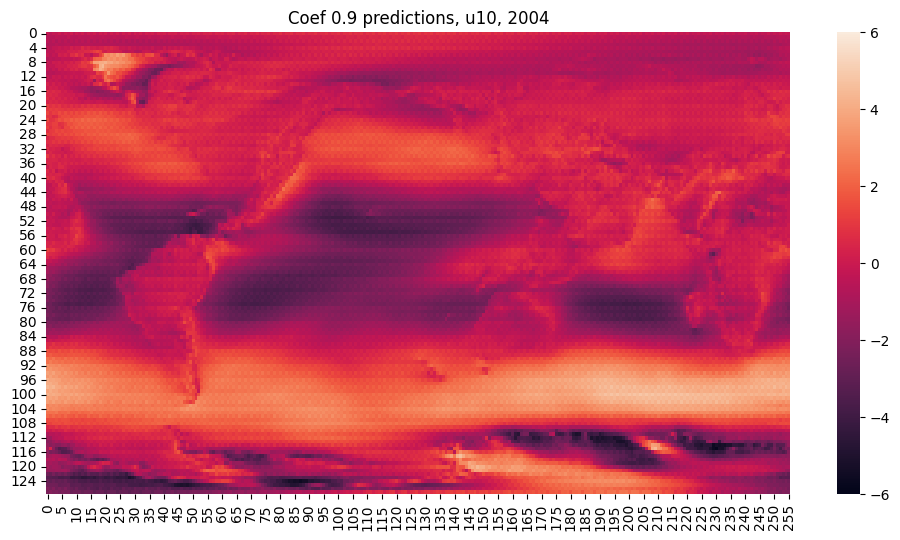

In [184]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_09_maps['pred'][1], dims=(0, 1)), vmin=-6, vmax=6, ax=ax)
plt.title('Coef 0.9 predictions, u10, 2004')
plt.show()

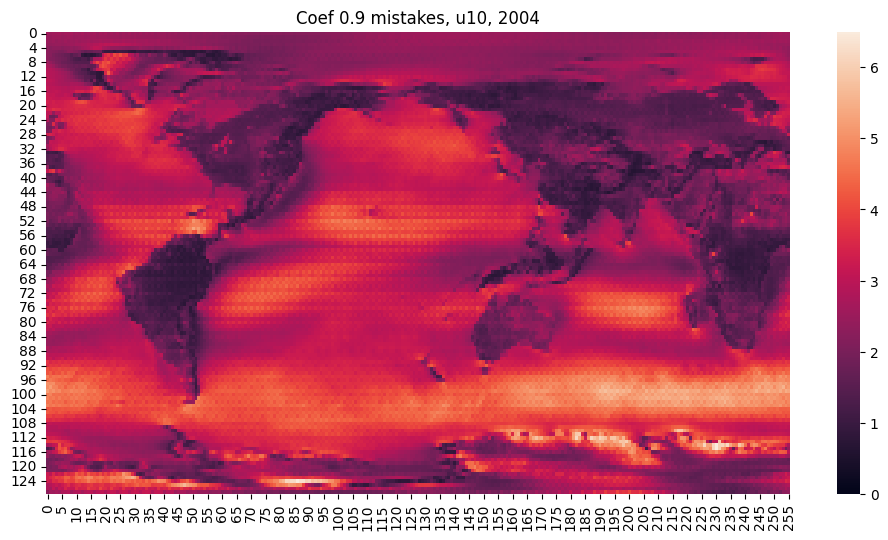

In [185]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(torch.flip(dict_validation_coef_09_maps['mistakes'][1], dims=(0, 1)), vmin=0, vmax=6.5, ax=ax)
plt.title('Coef 0.9 mistakes, u10, 2004')
plt.show()

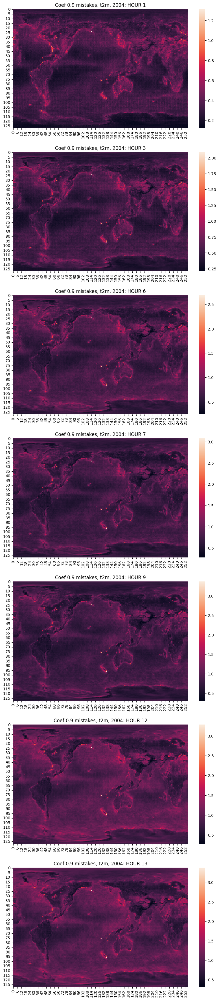

In [12]:
import seaborn as sns

fig, ax = plt.subplots(7, 1, figsize=(10, 45))

for id, hour in enumerate([0, 2, 5, 6, 8, 11, 12]): 
    sns.heatmap(torch.flip(dict_validation_coef_09_maps['mistakes'][1, hour], dims=(0, 1)), ax=ax[id])
    ax[id].set_title('Coef 0.9 mistakes, t2m, 2004: HOUR ' + str(hour + 1))

plt.show()

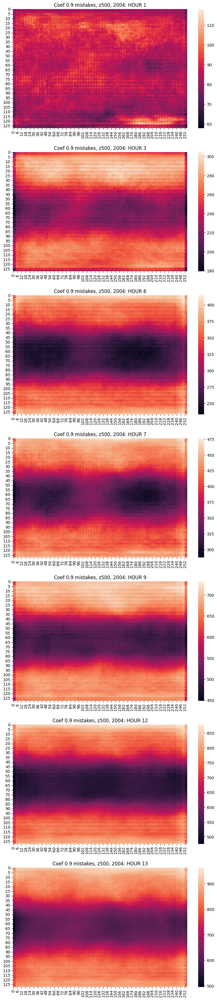

In [11]:
import seaborn as sns

fig, ax = plt.subplots(7, 1, figsize=(10, 45))

for id, hour in enumerate([0, 2, 5, 6, 8, 11, 12]): 
    sns.heatmap(torch.flip(dict_validation_coef_09_maps['mistakes'][2, hour], dims=(0, 1)), ax=ax[id])
    ax[id].set_title('Coef 0.9 mistakes, z500, 2004: HOUR ' + str(hour + 1))

plt.show()

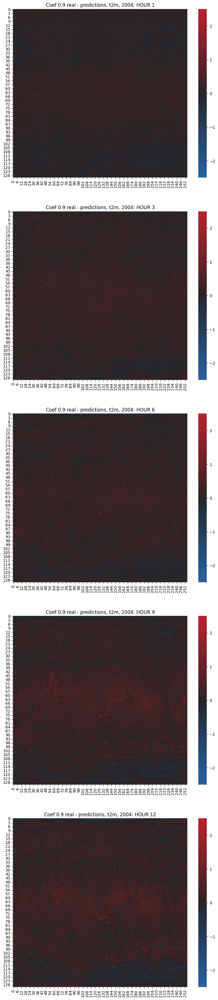

In [24]:
import seaborn as sns

fig, ax = plt.subplots(5, 1, figsize=(10, 45))

cmap = sns.diverging_palette(250, 10, s=85, l=40, n=70, center="dark")

for id, hour in enumerate([0, 2, 5, 8, 11]): 
    sns.heatmap(torch.flip(dict_validation_coef_09_maps['real'][1, hour] - dict_validation_coef_09_maps['pred'][1, hour], dims=(0, 1)), cmap=cmap, vmin=-2.5, vmax=2.5, ax=ax[id])
    ax[id].set_title('Coef 0.9 real - predictions, t2m, 2004: HOUR ' + str(hour + 1))

plt.show()

In [22]:
torch.mean(dict_validation_coef_09_maps['real'][1, hour] - dict_validation_coef_09_maps['pred'][1, hour])

tensor(0.1357)

### Графики

([<matplotlib.axis.XTick at 0x2aece48e6100>,
 [Text(1, 0, '1'),
  Text(3, 0, '3'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(9, 0, '9'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(15, 0, '15'),
  Text(18, 0, '18')])

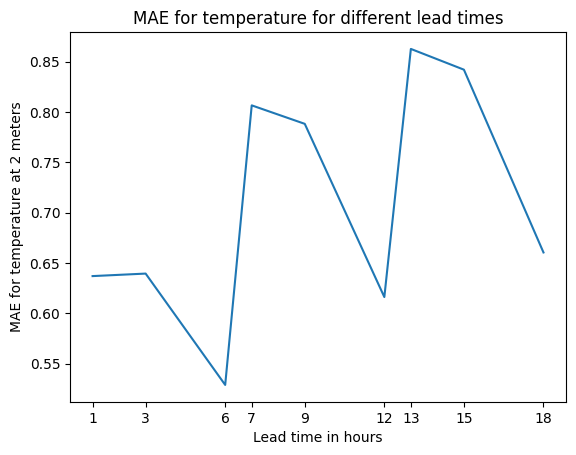

In [19]:
import torch
import matplotlib.pyplot as plt
import numpy as np

dict_validation_original = torch.load('checkpoints/original_mae_2004.results', map_location='cpu')

plt.title('MAE for temperature for different lead times')
plt.xlabel('Lead time in hours')
plt.ylabel('MAE for temperature at 2 meters')

ids = np.array([1, 3, 6, 7, 9, 12, 13, 15, 18])
plt.plot(ids.astype(int), dict_validation_original['t2m'][ids - 1])
plt.xticks(ids)

In [130]:
dict_validation_original = torch.load('checkpoints/original_mae_2004.results', map_location='cpu')

dict_constant_mistakes_2018 = torch.load('checkpoints/constant_prediction_mistakes_2018.results', map_location='cpu')

dict_validation_our_01 = torch.load('checkpoints/physical_01_validation.results', map_location='cpu')
dict_validation_our_01_2018 = torch.load('checkpoints/physical_01_validation_2018.results', map_location='cpu')
dict_validation_our_05 = torch.load('checkpoints/physical_05_validation.results', map_location='cpu')
dict_validation_our_09 = torch.load('checkpoints/physical_09_validation.results', map_location='cpu')

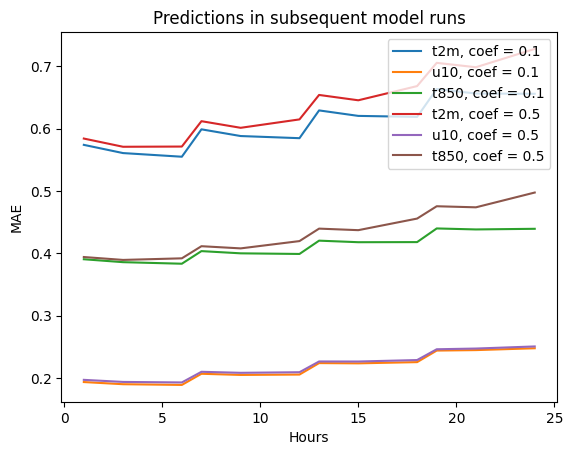

In [62]:
import matplotlib.pyplot as plt

plt.title('Predictions in subsequent model runs')
plt.xlabel('Hours')
plt.ylabel('MAE')

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])

plt.plot(ids + 1, mistakes_coef_01[0, ids], label='t2m, coef = 0.1')
plt.plot(ids + 1, mistakes_coef_01[1, ids], label='u10, coef = 0.1')
#plt.plot(range(6), mistakes_coef_01[2, :6], label='z500')
plt.plot(ids + 1, mistakes_coef_01[3, ids], label='t850, coef = 0.1')

plt.plot(ids + 1, mistakes_coef_05[0, ids], label='t2m, coef = 0.5')
plt.plot(ids + 1, mistakes_coef_05[1, ids], label='u10, coef = 0.5')
#plt.plot(range(6), mistakes_coef_01[2, :6], label='z500')
plt.plot(ids + 1, mistakes_coef_05[3, ids], label='t850, coef = 0.5')

plt.legend()
plt.show()

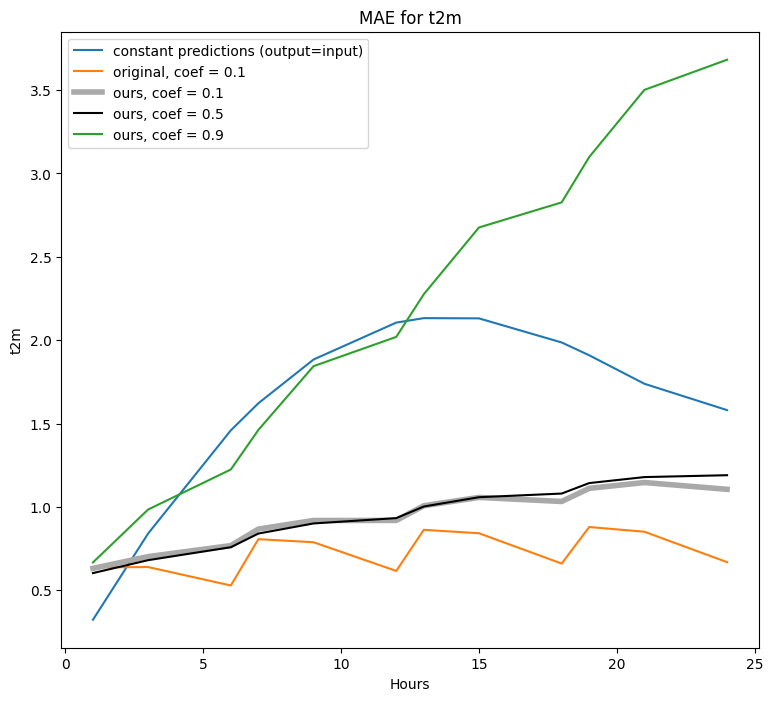

In [190]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 8))


plt.title('MAE for t2m')
plt.xlabel('Hours')
plt.ylabel('t2m')

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])



plt.plot(ids + 1, dict_constant_mistakes_2018['t2m'][ids], label='constant predictions (output=input)')

plt.plot(ids + 1, dict_validation_original['t2m'][ids], label='original, coef = 0.1')

plt.plot(ids + 1, dict_validation_our_01['t2m'][ids], label='ours, coef = 0.1', linewidth=4, color='darkgray')

plt.plot(ids + 1, dict_validation_our_05['t2m'][ids], label='ours, coef = 0.5', color='black')

plt.plot(ids + 1, dict_validation_our_09['t2m'][ids], label='ours, coef = 0.9')

#plt.plot(ids + 1, dict_validation_our_01_2018['u10'][ids], label='ours 2018 val, coef = 0.1')
#plt.plot(ids + 1, dict_validation_our_05['u10'][ids], label='ours, coef = 0.8')


plt.legend()
plt.show()

In [174]:
print(dict_validation_original['t2m'])

tensor([ 0.6369, 17.4274,  0.6394, 21.1873, 19.1319,  0.5288,  0.8066, 17.3689,
         0.7882, 21.2065, 19.0804,  0.6161,  0.8627, 17.3609,  0.8420, 21.2323,
        19.1006,  0.6604,  0.8795, 17.3694,  0.8512, 21.2485, 19.1051,  0.6688])


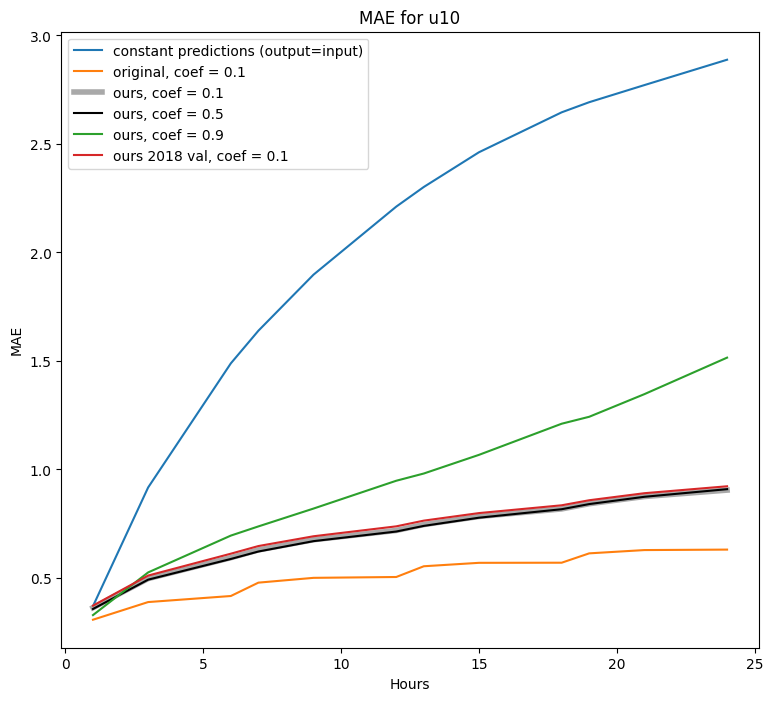

In [163]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 8))

plt.title('MAE for u10')
plt.xlabel('Hours')
plt.ylabel('MAE')

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])


plt.plot(ids + 1, dict_constant_mistakes_2018['u10'][ids], label='constant predictions (output=input)')

plt.plot(ids + 1, dict_validation_original['u10'][ids], label='original, coef = 0.1')

plt.plot(ids + 1, dict_validation_our_01['u10'][ids], label='ours, coef = 0.1', linewidth=4, color='darkgray')

plt.plot(ids + 1, dict_validation_our_05['u10'][ids], label='ours, coef = 0.5', color='black')

plt.plot(ids + 1, dict_validation_our_09['u10'][ids], label='ours, coef = 0.9')

plt.plot(ids + 1, dict_validation_our_01_2018['u10'][ids], label='ours 2018 val, coef = 0.1')

#plt.plot(ids + 1, dict_validation_our_05['u10'][ids], label='ours, coef = 0.8')

plt.legend()
plt.show()

In [144]:
 dict_validation_original['z500'][np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])]

tensor([90.2150, 81.9941, 22.2491, 96.6590, 86.7783, 29.9913, 95.4983, 86.4180,
        37.6949, 96.1823, 87.5906, 44.9243])

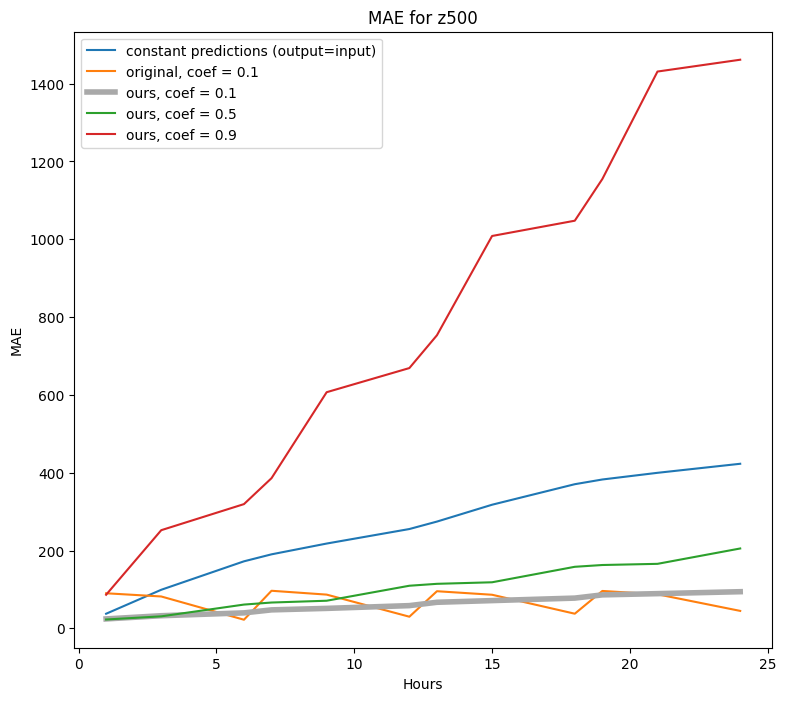

In [167]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 8))

plt.title('MAE for z500')
plt.xlabel('Hours')
plt.ylabel('MAE')

ids = np.array([0, 2, 5, 6, 8, 11, 12, 14, 17, 18, 20, 23])

plt.plot(ids + 1, dict_constant_mistakes_2018['z500'][ids], label='constant predictions (output=input)')

plt.plot(ids + 1, dict_validation_original['z500'][ids], label='original, coef = 0.1')
#plt.plot(ids + 1, dict_validation_our_01_2018['z500'][ids], label='ours validation 2018, coef = 0.1')


#plt.plot([5, 10, 15, 20, 24], [20, 30, 40, 40, 50], label='paper, approximation')

plt.plot(ids + 1, dict_validation_our_01['z500'][ids], label='ours, coef = 0.1', linewidth=4, color='darkgray')
plt.plot(ids + 1, dict_validation_our_05['z500'][ids], label='ours, coef = 0.5')
plt.plot(ids + 1, dict_validation_our_09['z500'][ids], label='ours, coef = 0.9')

plt.legend()
plt.show()